### Import Libraries

In [112]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import random
import pprint
import sys
import time
import numpy as np
import pickle
import math
import cv2
import copy
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import os
import csv

from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import classification_report



import tensorflow as tf

from keras import backend as K
from keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Layer, Flatten, Add, Dense, Input, InputSpec, Conv2D, Convolution2D, Activation, ZeroPadding2D, AveragePooling2D, MaxPooling2D, Dropout, TimeDistributed
from keras.losses import categorical_crossentropy

from keras.models import Model
from keras import initializers, regularizers

Config

In [113]:
class Config:
	def __init__(self):

		self.verbose = True

		# Name of base network (vgg or resnet)
		self.network = 'resnet'

		# Setting for data augmentation
		self.use_horizontal_flips = False
		self.use_vertical_flips = False
		self.rot_90 = False

		# Anchor box scales
    	# Note that if im_size is smaller, anchor_box_scales should be scaled
		self.anchor_box_scales = [128, 256, 512]

		# Anchor box ratios
		self.anchor_box_ratios = [[1, 1], [1./math.sqrt(2), 2./math.sqrt(2)], [2./math.sqrt(2), 1./math.sqrt(2)]]

		# Size to resize the smallest side of the image
		# Original setting in paper is 600. Set to 300 in here to save training time
		self.im_size = 640

		# image channel-wise mean to subtract
		self.img_channel_mean = [144.17631833, 144.17631833, 144.17631833]
		self.img_scaling_factor = 1.0

		# number of ROIs at once
		self.num_rois = 4

		# stride at the RPN (this depends on the network configuration)
		self.rpn_stride = 16

		self.balanced_classes = False

		# scaling the stdev
		self.std_scaling = 4.0
		self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

		# overlaps for RPN
		self.rpn_min_overlap = 0.3
		self.rpn_max_overlap = 0.7

		# overlaps for classifier ROIs
		self.classifier_min_overlap = 0.1
		self.classifier_max_overlap = 0.5

		# Dataset path
		self.test_path = "dataset/test"

		# placeholder for the class mapping, automatically generated by the parser
		self.class_mapping = None

		self.record_path = "model/record_resnet_640_big_anchor.csv"
		self.model_path = "model/model_frcnn_resnet_640_big_anchor.h5"

		self.config_path = "config/config_resnet_640_big_anchor.pickle"
		self.use_config = True
	


Parse data from annotation files

In [114]:
def get_data(input_path, debug=False):
	"""Parse the data from annotation file
	
	Args:
		input_path: file path to folder containing annotation files

	Returns:
		all_data: list(filepath, width, height, list(bboxes))
		classes_count: dict{key:class_name, value:count_num}
		class_mapping: dict{key:class_name, value: idx}
		"""
	
	all_data = []
	classes_count = {}
	class_mapping = {"burr":0,"crack":1,"pit":2,"unpolished":3, "no_defect": 4}

	#image_blacklist = ["cast_def_0_3292","cast_def_0_3380","cast_def_0_937","cast_def_0_9276","cast_def_0_5214","cast_def_0_5205","cast_def_0_7994","cast_def_0_9079"]

	visualise = True

	print('Parsing annotation files')

	label_filenames = os.listdir( os.path.join(input_path, 'labels') )
	
	for filename in label_filenames:

		
		label_path = os.path.join(input_path,'labels', filename)

		# read the image
		img_path = os.path.join(input_path, 'images', filename.replace('txt', 'jpg'))
		img = cv2.imread(img_path)
		img_height, img_width, _ = img.shape

		data = {'img_path':img_path, 'label_path': label_path, 'width': img_width, 'height': img_height, 'bboxes': []}

		# flag to skip image from dataset
		skip = False
		with open(label_path, 'r') as f:

			for line in f.readlines():

				split = line.strip().split()
				class_id = int(split[0])

				x_center = float(split[1])
				y_center = float(split[2])
				width = float(split[3])
				height = float(split[4])

				# convert to (x1,y1,x2,y2) rectangle
				x1 = int((x_center - width/2) * img_width)
				y1 = int((y_center - height/2) * img_height)
				x2 = int((x_center + width/2) * img_width)
				y2 = int((y_center + height/2) * img_height)

				class_name = list(class_mapping.keys())[list(class_mapping.values()).index(class_id)]

				## CONSERTANDO ANOTAÇÕES QUE SAEM DA IMAGEM
				if class_name == "no_defect" and (x1 < 0 or y1 < 0 or x2 > img_width or y2 > img_height):
					if debug: print("No Defect Image out of bounds: ", img_path)
					if x1 < 0:
						x1 = 0
					if y1 < 0:
						y1 = 0
					if x2 > img_width:
						x2 = img_width
					if y2 > img_height:
						y2 = img_height
					if debug: print("Fixed: ", x1, y1, x2, y2)

				if class_name == "crack" and (x1 < 0 or y1 < 0 or x2 > img_width or y2 > img_height):
					if debug:
						print("Crack Image out of bounds: ", img_path)
						print("Skipping image")
					skip = True
				## FIM CONSERTANDO ANOTAÇÕES QUE SAEM DA IMAGEM

				data['bboxes'].append({'class': class_name, 'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2})

				if not skip:
					if class_name not in classes_count:
						classes_count[class_name] = 1
					else:
						classes_count[class_name] += 1

		if not skip:
			all_data.append(data)

	return all_data, classes_count, class_mapping

## Faster R-CNN Model

ROI Pooling Convolutional Layer

In [115]:
class RoiPoolingConv(Layer):
    '''ROI pooling layer for 2D inputs.
    See Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition,
    K. He, X. Zhang, S. Ren, J. Sun
    # Arguments
        pool_size: int
            Size of pooling region to use. pool_size = 7 will result in a 7x7 region.
        num_rois: number of regions of interest to be used
    # Input shape
        list of two 4D tensors [X_img,X_roi] with shape:
        X_img:
        `(1, rows, cols, channels)`
        X_roi:
        `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
    # Output shape
        3D tensor with shape:
        `(1, num_rois, channels, pool_size, pool_size)`
    '''
    def __init__(self, pool_size, num_rois, **kwargs):

        self.dim_ordering = K.image_data_format()
        self.pool_size = pool_size
        self.num_rois = num_rois

        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]   

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):

        assert(len(x) == 2)

        # x[0] is image with shape (rows, cols, channels)
        img = x[0]

        # x[1] is roi with shape (num_rois,4) with ordering (x,y,w,h)
        rois = x[1]

        input_shape = K.shape(img)

        outputs = []

        for roi_idx in range(self.num_rois):

            x = rois[0, roi_idx, 0]
            y = rois[0, roi_idx, 1]
            w = rois[0, roi_idx, 2]
            h = rois[0, roi_idx, 3]

            x = K.cast(x, 'int32')
            y = K.cast(y, 'int32')
            w = K.cast(w, 'int32')
            h = K.cast(h, 'int32')

            # Resized roi of the image to pooling size (7x7)
            rs = tf.image.resize(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))
            outputs.append(rs)
                

        final_output = K.concatenate(outputs, axis=0)

        # Reshape to (1, num_rois, pool_size, pool_size, nb_channels)
        # Might be (1, 4, 7, 7, 3)
        final_output = K.reshape(final_output, (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels))

        # permute_dimensions is similar to transpose
        final_output = K.permute_dimensions(final_output, (0, 1, 2, 3, 4))

        return final_output
    
    
    def get_config(self):
        config = {'pool_size': self.pool_size,
                  'num_rois': self.num_rois}
        base_config = super(RoiPoolingConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

VGG-16

In [116]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)    

def nn_base(input_tensor=None, trainable=False):


    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3

    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    return x


RPN Layer

In [117]:
def rpn_layer(base_layers, num_anchors):
    """Create a rpn layer
        Step1: Pass through the feature map from base layer to a 3x3 512 channels convolutional layer
                Keep the padding 'same' to preserve the feature map's size
        Step2: Pass the step1 to two (1,1) convolutional layer to replace the fully connected layer
                classification layer: num_anchors (9 in here) channels for 0, 1 sigmoid activation output
                regression layer: num_anchors*4 (36 in here) channels for computing the regression of bboxes with linear activation
    Args:
        base_layers: vgg in here
        num_anchors: 9 in here

    Returns:
        [x_class, x_regr, base_layers]
        x_class: classification for whether it's an object
        x_regr: bboxes regression
        base_layers: vgg in here
    """
    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

Classifier Layer

In [118]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes = 4, trainable=False):
    """Create a classifier layer
    
    Args:
        base_layers: vgg
        input_rois: `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
        num_rois: number of rois to be processed in one time (4 in here)

    Returns:
        list(out_class, out_regr)
        out_class: classifier layer output
        out_regr: regression layer output
    """

    input_shape = (num_rois,7,7,512)

    pooling_regions = 7

    # out_roi_pool.shape = (1, num_rois, channels, pool_size, pool_size)
    # num_rois (4) 7x7 roi pooling
    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])

    # Flatten the convlutional layer and connected to 2 FC and 2 dropout
    out = TimeDistributed(Flatten(name='flatten'))(out_roi_pool)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc1'))(out)
    out = TimeDistributed(Dropout(0.5))(out)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc2'))(out)
    out = TimeDistributed(Dropout(0.5))(out)

    # There are two output layer
    # out_class: softmax acivation function for classify the class name of the object
    # out_regr: linear activation function for bboxes coordinates regression
    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)

    return [out_class, out_regr]

### Resnet

In [119]:
# Fixed Batch Normalization for Resnet

class FixedBatchNormalization(Layer):

    def __init__(self, epsilon=1e-3, axis=-1,
                 weights=None, beta_init='zero', gamma_init='one',
                 gamma_regularizer=None, beta_regularizer=None, **kwargs):

        self.supports_masking = True
        self.beta_init = initializers.get(beta_init)
        self.gamma_init = initializers.get(gamma_init)
        self.epsilon = epsilon
        self.axis = axis
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.initial_weights = weights
        super(FixedBatchNormalization, self).__init__(**kwargs)

    def build(self, input_shape):
        self.input_spec = [InputSpec(shape=input_shape)]
        shape = (input_shape[self.axis],)

        self.gamma = self.add_weight(shape=shape,
                                     initializer=self.gamma_init,
                                     regularizer=self.gamma_regularizer,
                                     name='{}_gamma'.format(self.name),
                                     trainable=False)
        self.beta = self.add_weight(shape=shape,
                                    initializer=self.beta_init,
                                    regularizer=self.beta_regularizer,
                                    name='{}_beta'.format(self.name),
                                    trainable=False)
        self.running_mean = self.add_weight(shape=shape, initializer='zero',
                                            name='{}_running_mean'.format(self.name),
                                            trainable=False)
        self.running_std = self.add_weight(shape=shape, initializer='one',
                                           name='{}_running_std'.format(self.name),
                                           trainable=False)

        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights

        self.built = True

    def call(self, x, mask=None):

        assert self.built, 'Layer must be built before being called'
        input_shape = K.int_shape(x)

        reduction_axes = list(range(len(input_shape)))
        del reduction_axes[self.axis]
        broadcast_shape = [1] * len(input_shape)
        broadcast_shape[self.axis] = input_shape[self.axis]

        if sorted(reduction_axes) == range(K.ndim(x))[:-1]:
            x_normed = K.batch_normalization(
                x, self.running_mean, self.running_std,
                self.beta, self.gamma,
                epsilon=self.epsilon)
        else:
            # need broadcasting
            broadcast_running_mean = K.reshape(self.running_mean, broadcast_shape)
            broadcast_running_std = K.reshape(self.running_std, broadcast_shape)
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            x_normed = K.batch_normalization(
                x, broadcast_running_mean, broadcast_running_std,
                broadcast_beta, broadcast_gamma,
                epsilon=self.epsilon)

        return x_normed

    def get_config(self):
        config = {'epsilon': self.epsilon,
                  'axis': self.axis,
                  'gamma_regularizer': self.gamma_regularizer.get_config() if self.gamma_regularizer else None,
                  'beta_regularizer': self.beta_regularizer.get_config() if self.beta_regularizer else None}
        base_config = super(FixedBatchNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [120]:
def get_img_output_length_resnet(width, height):
    def get_output_length(input_length):
        # zero_pad
        input_length += 6
        # apply 4 strided convolutions
        filter_sizes = [7, 3, 1, 1]
        stride = 2
        for filter_size in filter_sizes:
            input_length = (input_length - filter_size + stride) // stride
        return input_length

    return get_output_length(width), get_output_length(height) 

def identity_block(input_tensor, kernel_size, filters, stage, block, trainable=True):

    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3


    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), name=conv_name_base + '2a', trainable=trainable)(input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)
    return x


def identity_block_td(input_tensor, kernel_size, filters, stage, block, trainable=True):

    # identity block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters

    bn_axis = 3

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(Convolution2D(nb_filter1, (1, 1), trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter2, (kernel_size, kernel_size), trainable=trainable, kernel_initializer='normal',padding='same'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2c')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)

    return x

def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2), trainable=True):

    nb_filter1, nb_filter2, nb_filter3 = filters
    bn_axis = 3
    
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), strides=strides, name=conv_name_base + '2a', trainable=trainable)(input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    shortcut = Convolution2D(nb_filter3, (1, 1), strides=strides, name=conv_name_base + '1', trainable=trainable)(input_tensor)
    shortcut = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x


def conv_block_td(input_tensor, kernel_size, filters, stage, block, input_shape, strides=(2, 2), trainable=True):

    # conv block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters

    bn_axis = 3


    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(Convolution2D(nb_filter1, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'), input_shape=input_shape, name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), kernel_initializer='normal'), name=conv_name_base + '2c', trainable=trainable)(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    shortcut = TimeDistributed(Convolution2D(nb_filter3, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '1')(input_tensor)
    shortcut = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def nn_base_resnet(input_tensor=None, trainable=False):
   
    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3
    
    x = ZeroPadding2D((3, 3))(img_input)

    x = Convolution2D(64, (7, 7), strides=(2, 2), name='conv1', trainable = trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name='bn_conv1')(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1), trainable = trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b', trainable = trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c', trainable = trainable)

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='d', trainable = trainable)

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f', trainable = trainable)

    return x


def classifier_layers_resnet(x, input_shape, trainable=False):

    # compile times on theano tend to be very high, so we use smaller ROI pooling regions to workaround
    # (hence a smaller stride in the region that follows the ROI pool)
    x = conv_block_td(x, 3, [512, 512, 2048], stage=5, block='a', input_shape=input_shape, strides=(2, 2), trainable=trainable)

    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='b', trainable=trainable)
    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='c', trainable=trainable)
    x = TimeDistributed(AveragePooling2D((7, 7)), name='avg_pool')(x)

    return x


def rpn_resnet(base_layers,num_anchors):

    x = Convolution2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Convolution2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Convolution2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

def classifier_resnet(base_layers, input_rois, num_rois, nb_classes = 6, trainable=False):

    pooling_regions = 14
    input_shape = (num_rois,14,14,1024)

    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])
    print("Roi pool shape: ", out_roi_pool.shape)
    out = classifier_layers_resnet(out_roi_pool, input_shape=input_shape, trainable=True)

    out = TimeDistributed(Flatten())(out)

    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)
    return [out_class, out_regr]

### Calculate Intersection over Union (IoU)

In [121]:
def union(au, bu, area_intersection):
	area_a = (au[2] - au[0]) * (au[3] - au[1])
	area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
	area_union = area_a + area_b - area_intersection
	return area_union


def intersection(ai, bi):
	x = max(ai[0], bi[0])
	y = max(ai[1], bi[1])
	w = min(ai[2], bi[2]) - x
	h = min(ai[3], bi[3]) - y
	if w < 0 or h < 0:
		return 0
	return w*h


def iou(a, b):
	# a and b should be (x1,y1,x2,y2)

	if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
		return 0.0

	area_i = intersection(a, b)
	area_u = union(a, b, area_i)

	return float(area_i) / float(area_u + 1e-6)

def giou(box1, box2):
    """
    Calculate the Generalized Intersection over Union (GIoU) of two bounding boxes.
    
    Parameters:
        box1: list or numpy array, [x1, y1, x2, y2]
        box2: list or numpy array, [x1, y1, x2, y2]
        
    Returns:
        float: GIoU score
    """
    
    # Calculate minimum convex hull that encloses both boxes
    x1 = min(box1[0], box2[0])
    y1 = min(box1[1], box2[1])
    x2 = max(box1[2], box2[2])
    y2 = max(box1[3], box2[3])
    C_area = (x2 - x1 + 1) * (y2 - y1 + 1)
    
    # Calculate GIoU
    giou = iou(box1,box2) - ((C_area - iou(box1, box2)) / C_area)
    
    return giou

Calculate RPN for all anchors of all images

In [122]:
def calc_rpn(C, img_data, width, height, resized_width, resized_height, img_length_calc_function):
	"""(Important part!) Calculate the rpn for all anchors 
		If feature map has shape 38x50=1900, there are 1900x9=17100 potential anchors
	
	Args:
		C: config
		img_data: augmented image data
		width: original image width (e.g. 600)
		height: original image height (e.g. 800)
		resized_width: resized image width according to C.im_size (e.g. 300)
		resized_height: resized image height according to C.im_size (e.g. 400)
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size

	Returns:
		y_rpn_cls: list(num_bboxes, y_is_box_valid + y_rpn_overlap)
			y_is_box_valid: 0 or 1 (0 means the box is invalid, 1 means the box is valid)
			y_rpn_overlap: 0 or 1 (0 means the box is not an object, 1 means the box is an object)
		y_rpn_regr: list(num_bboxes, 4*y_rpn_overlap + y_rpn_regr)
			y_rpn_regr: x1,y1,x2,y2 bunding boxes coordinates
	"""
	downscale = float(C.rpn_stride) 
	anchor_sizes = C.anchor_box_scales   # 128, 256, 512
	anchor_ratios = C.anchor_box_ratios  # 1:1, 1:2*sqrt(2), 2*sqrt(2):1
	num_anchors = len(anchor_sizes) * len(anchor_ratios) # 3x3=9

	# calculate the output map size based on the network architecture
	(output_width, output_height) = img_length_calc_function(resized_width, resized_height)

	n_anchratios = len(anchor_ratios)    # 3
	
	# initialise empty output objectives
	y_rpn_overlap = np.zeros((output_height, output_width, num_anchors))
	y_is_box_valid = np.zeros((output_height, output_width, num_anchors))
	y_rpn_regr = np.zeros((output_height, output_width, num_anchors * 4))

	num_bboxes = len(img_data['bboxes'])

	num_anchors_for_bbox = np.zeros(num_bboxes).astype(int)
	best_anchor_for_bbox = -1*np.ones((num_bboxes, 4)).astype(int)
	best_iou_for_bbox = np.zeros(num_bboxes).astype(np.float32)
	best_x_for_bbox = np.zeros((num_bboxes, 4)).astype(int)
	best_dx_for_bbox = np.zeros((num_bboxes, 4)).astype(np.float32)

	# get the GT box coordinates, and resize to account for image resizing
	gta = np.zeros((num_bboxes, 4))
	for bbox_num, bbox in enumerate(img_data['bboxes']):
		# get the GT box coordinates, and resize to account for image resizing
		gta[bbox_num, 0] = bbox['x1'] * (resized_width / float(width))
		gta[bbox_num, 1] = bbox['x2'] * (resized_width / float(width))
		gta[bbox_num, 2] = bbox['y1'] * (resized_height / float(height))
		gta[bbox_num, 3] = bbox['y2'] * (resized_height / float(height))
	
	# rpn ground truth

	for anchor_size_idx in range(len(anchor_sizes)):
		for anchor_ratio_idx in range(n_anchratios):
			anchor_x = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][0]
			anchor_y = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][1]	
			
			for ix in range(output_width):					
				# x-coordinates of the current anchor box	
				x1_anc = downscale * (ix + 0.5) - anchor_x / 2
				x2_anc = downscale * (ix + 0.5) + anchor_x / 2	
				
				# ignore boxes that go across image boundaries					
				if x1_anc < 0 or x2_anc > resized_width:
					continue
					
				for jy in range(output_height):

					# y-coordinates of the current anchor box
					y1_anc = downscale * (jy + 0.5) - anchor_y / 2
					y2_anc = downscale * (jy + 0.5) + anchor_y / 2

					# ignore boxes that go across image boundaries
					if y1_anc < 0 or y2_anc > resized_height:
						continue

					# bbox_type indicates whether an anchor should be a target
					# Initialize with 'negative'
					bbox_type = 'neg'

					# this is the best IOU for the (x,y) coord and the current anchor
					# note that this is different from the best IOU for a GT bbox
					best_iou_for_loc = 0.0

					for bbox_num in range(num_bboxes):
						
						# get IOU of the current GT box and the current anchor box
						curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1_anc, y1_anc, x2_anc, y2_anc])
						# calculate the regression targets if they will be needed
						if curr_iou > best_iou_for_bbox[bbox_num] or curr_iou > C.rpn_max_overlap:
							cx = (gta[bbox_num, 0] + gta[bbox_num, 1]) / 2.0
							cy = (gta[bbox_num, 2] + gta[bbox_num, 3]) / 2.0
							cxa = (x1_anc + x2_anc)/2.0
							cya = (y1_anc + y2_anc)/2.0

							# x,y are the center point of ground-truth bbox
							# xa,ya are the center point of anchor bbox (xa=downscale * (ix + 0.5); ya=downscale * (iy+0.5))
							# w,h are the width and height of ground-truth bbox
							# wa,ha are the width and height of anchor bboxe
							# tx = (x - xa) / wa
							# ty = (y - ya) / ha
							# tw = log(w / wa)
							# th = log(h / ha)
							tx = (cx - cxa) / (x2_anc - x1_anc)
							ty = (cy - cya) / (y2_anc - y1_anc)
							tw = np.log((gta[bbox_num, 1] - gta[bbox_num, 0]) / (x2_anc - x1_anc))
							th = np.log((gta[bbox_num, 3] - gta[bbox_num, 2]) / (y2_anc - y1_anc))
						
						if img_data['bboxes'][bbox_num]['class'] != 'bg':

							# all GT boxes should be mapped to an anchor box, so we keep track of which anchor box was best
							if curr_iou > best_iou_for_bbox[bbox_num]:
								best_anchor_for_bbox[bbox_num] = [jy, ix, anchor_ratio_idx, anchor_size_idx]
								best_iou_for_bbox[bbox_num] = curr_iou
								best_x_for_bbox[bbox_num,:] = [x1_anc, x2_anc, y1_anc, y2_anc]
								best_dx_for_bbox[bbox_num,:] = [tx, ty, tw, th]

							# we set the anchor to positive if the IOU is >0.7 (it does not matter if there was another better box, it just indicates overlap)
							if curr_iou > C.rpn_max_overlap:
								bbox_type = 'pos'
								num_anchors_for_bbox[bbox_num] += 1
								# we update the regression layer target if this IOU is the best for the current (x,y) and anchor position
								if curr_iou > best_iou_for_loc:
									best_iou_for_loc = curr_iou
									best_regr = (tx, ty, tw, th)

							# if the IOU is >0.3 and <0.7, it is ambiguous and no included in the objective
							if C.rpn_min_overlap < curr_iou < C.rpn_max_overlap:
								# gray zone between neg and pos
								if bbox_type != 'pos':
									bbox_type = 'neutral'

					# turn on or off outputs depending on IOUs
					if bbox_type == 'neg':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'neutral':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'pos':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						start = 4 * (anchor_ratio_idx + n_anchratios * anchor_size_idx)
						y_rpn_regr[jy, ix, start:start+4] = best_regr

	# we ensure that every bbox has at least one positive RPN region

	for idx in range(num_anchors_for_bbox.shape[0]):
		if num_anchors_for_bbox[idx] == 0:
			# no box with an IOU greater than zero ...
			if best_anchor_for_bbox[idx, 0] == -1:
				continue
			y_is_box_valid[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			y_rpn_overlap[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			start = 4 * (best_anchor_for_bbox[idx,2] + n_anchratios * best_anchor_for_bbox[idx,3])
			y_rpn_regr[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], start:start+4] = best_dx_for_bbox[idx, :]

	y_rpn_overlap = np.transpose(y_rpn_overlap, (2, 0, 1))
	y_rpn_overlap = np.expand_dims(y_rpn_overlap, axis=0)

	y_is_box_valid = np.transpose(y_is_box_valid, (2, 0, 1))
	y_is_box_valid = np.expand_dims(y_is_box_valid, axis=0)

	y_rpn_regr = np.transpose(y_rpn_regr, (2, 0, 1))
	y_rpn_regr = np.expand_dims(y_rpn_regr, axis=0)

	pos_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 1, y_is_box_valid[0, :, :, :] == 1))
	neg_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 0, y_is_box_valid[0, :, :, :] == 1))

	num_pos = len(pos_locs[0])

	# one issue is that the RPN has many more negative than positive regions, so we turn off some of the negative
	# regions. We also limit it to 256 regions.
	num_regions = 256

	if len(pos_locs[0]) > num_regions/2:
		val_locs = random.sample(range(len(pos_locs[0])), len(pos_locs[0]) - num_regions/2)
		y_is_box_valid[0, pos_locs[0][val_locs], pos_locs[1][val_locs], pos_locs[2][val_locs]] = 0
		num_pos = num_regions/2

	if len(neg_locs[0]) + num_pos > num_regions:
		val_locs = random.sample(range(len(neg_locs[0])), len(neg_locs[0]) - num_pos)
		y_is_box_valid[0, neg_locs[0][val_locs], neg_locs[1][val_locs], neg_locs[2][val_locs]] = 0

	y_rpn_cls = np.concatenate([y_is_box_valid, y_rpn_overlap], axis=1)
	y_rpn_regr = np.concatenate([np.repeat(y_rpn_overlap, 4, axis=1), y_rpn_regr], axis=1)

	return np.copy(y_rpn_cls), np.copy(y_rpn_regr), num_pos

Augmentation

In [123]:
def get_new_img_size(width, height, img_min_side=640):
	if width <= height:
		f = float(img_min_side) / width
		resized_height = int(f * height)
		resized_width = img_min_side
	else:
		f = float(img_min_side) / height
		resized_width = int(f * width)
		resized_height = img_min_side

	return resized_width, resized_height

def augment(img_data, config, augment=True):
	assert 'img_path' in img_data
	assert 'label_path' in img_data
	assert 'bboxes' in img_data
	assert 'width' in img_data
	assert 'height' in img_data

	img_data_aug = copy.deepcopy(img_data)

	img = cv2.imread(img_data_aug['img_path'])

	if augment:
		rows, cols = img.shape[:2]

		if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 1)
			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				bbox['x2'] = cols - x1
				bbox['x1'] = cols - x2

		if config.use_vertical_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 0)
			for bbox in img_data_aug['bboxes']:
				y1 = bbox['y1']
				y2 = bbox['y2']
				bbox['y2'] = rows - y1
				bbox['y1'] = rows - y2

		if config.rot_90:
			angle = np.random.choice([0,90,180,270],1)[0]
			if angle == 270:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 0)
			elif angle == 180:
				img = cv2.flip(img, -1)
			elif angle == 90:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 1)
			elif angle == 0:
				pass

			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				y1 = bbox['y1']
				y2 = bbox['y2']
				if angle == 270:
					bbox['x1'] = y1
					bbox['x2'] = y2
					bbox['y1'] = cols - x2
					bbox['y2'] = cols - x1
				elif angle == 180:
					bbox['x2'] = cols - x1
					bbox['x1'] = cols - x2
					bbox['y2'] = rows - y1
					bbox['y1'] = rows - y2
				elif angle == 90:
					bbox['x1'] = rows - y2
					bbox['x2'] = rows - y1
					bbox['y1'] = x1
					bbox['y2'] = x2        
				elif angle == 0:
					pass

	img_data_aug['width'] = img.shape[1]
	img_data_aug['height'] = img.shape[0]
	return img_data_aug, img

Generate "Ground Truth" Anchors

In [124]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):
	""" Yield the ground-truth anchors as Y (labels)
		
	Args:
		all_img_data: list(filepath, width, height, list(bboxes))
		C: config
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size
		mode: 'train' or 'test'; 'train' mode need augmentation

	Returns:
		x_img: image data after resized and scaling (smallest size = 300px)
		Y: [y_rpn_cls, y_rpn_regr]
		img_data_aug: augmented image data (original image with augmentation)
		debug_img: show image for debug
		num_pos: show number of positive anchors for debug
	"""
	while True:

		for img_data in all_img_data:
			try:

				# read in image, and optionally add augmentation

				if mode == 'train':
					img_data_aug, x_img = augment(img_data, C, augment=True)
				else:
					img_data_aug, x_img = augment(img_data, C, augment=False)

				(width, height) = (img_data_aug['width'], img_data_aug['height'])
				(rows, cols, _) = x_img.shape

				assert cols == width
				assert rows == height

				# get image dimensions for resizing
				(resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

				# resize the image so that smalles side is length = 300px
				x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
				debug_img = x_img.copy()

				try:
					y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
				except:
					continue

				# Zero-center by mean pixel, and preprocess image

				x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
				x_img = x_img.astype(np.float32)
				x_img[:, :, 0] -= C.img_channel_mean[0]
				x_img[:, :, 1] -= C.img_channel_mean[1]
				x_img[:, :, 2] -= C.img_channel_mean[2]
				x_img /= C.img_scaling_factor

				x_img = np.transpose(x_img, (2, 0, 1))
				x_img = np.expand_dims(x_img, axis=0)

				y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling

				x_img = np.transpose(x_img, (0, 2, 3, 1))
				y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
				y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))

				###
				# x_img convert to int32
				# x_img = np.around(x_img)
				###

				yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos

			except Exception as e:
				print(e)
				continue

Define loss functions for all four outputs

In [125]:
lambda_rpn_regr = 1.0
lambda_rpn_class = 1.0

lambda_cls_regr = 1.0
lambda_cls_class = 1.0

epsilon = 1e-4

In [126]:
def rpn_loss_regr(num_anchors):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def rpn_loss_regr_fixed_num(y_true, y_pred):

        # x is the difference between true value and predicted vaue
        x = y_true[:, :, :, 4 * num_anchors:] - y_pred

        # absolute value of x
        x_abs = K.abs(x)

        # If x_abs <= 1.0, x_bool = 1
        x_bool = K.cast(K.less_equal(x_abs, 1.0), tf.float32)

        return lambda_rpn_regr * K.sum(
            y_true[:, :, :, :4 * num_anchors] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :, :4 * num_anchors])

    return rpn_loss_regr_fixed_num


def rpn_loss_cls(num_anchors):
    """Loss function for rpn classification
    Args:
        num_anchors: number of anchors (9 in here)
        y_true[:, :, :, :9]: [0,1,0,0,0,0,0,1,0] means only the second and the eighth box is valid which contains pos or neg anchor => isValid
        y_true[:, :, :, 9:]: [0,1,0,0,0,0,0,0,0] means the second box is pos and eighth box is negative
    Returns:
        lambda * sum((binary_crossentropy(isValid*y_pred,y_true))) / N
    """
    def rpn_loss_cls_fixed_num(y_true, y_pred):

            return lambda_rpn_class * K.sum(y_true[:, :, :, :num_anchors] * K.binary_crossentropy(y_pred[:, :, :, :], y_true[:, :, :, num_anchors:])) / K.sum(epsilon + y_true[:, :, :, :num_anchors])

    return rpn_loss_cls_fixed_num


def class_loss_regr(num_classes):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def class_loss_regr_fixed_num(y_true, y_pred):
        x = y_true[:, :, 4*num_classes:] - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), 'float32')
        return lambda_cls_regr * K.sum(y_true[:, :, :4*num_classes] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :4*num_classes])
    return class_loss_regr_fixed_num


def class_loss_cls(y_true, y_pred):
    return lambda_cls_class * K.mean(categorical_crossentropy(y_true[0, :, :], y_pred[0, :, :]))

Non Max Suppression

In [127]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
    # code used from here: http://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/
    # if there are no boxes, return an empty list

    # Process explanation:
    #   Step 1: Sort the probs list
    #   Step 2: Find the larget prob 'Last' in the list and save it to the pick list
    #   Step 3: Calculate the IoU with 'Last' box and other boxes in the list. If the IoU is larger than overlap_threshold, delete the box from list
    #   Step 4: Repeat step 2 and step 3 until there is no item in the probs list 
    if len(boxes) == 0:
        return []

    # grab the coordinates of the bounding boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    np.testing.assert_array_less(x1, x2)
    np.testing.assert_array_less(y1, y2)

    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    # initialize the list of picked indexes	
    pick = []

    # calculate the areas
    area = (x2 - x1) * (y2 - y1)

    # sort the bounding boxes 
    idxs = np.argsort(probs)

    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        # find the intersection

        xx1_int = np.maximum(x1[i], x1[idxs[:last]])
        yy1_int = np.maximum(y1[i], y1[idxs[:last]])
        xx2_int = np.minimum(x2[i], x2[idxs[:last]])
        yy2_int = np.minimum(y2[i], y2[idxs[:last]])

        ww_int = np.maximum(0, xx2_int - xx1_int)
        hh_int = np.maximum(0, yy2_int - yy1_int)

        area_int = ww_int * hh_int

        # find the union
        area_union = area[i] + area[idxs[:last]] - area_int

        # compute the ratio of overlap
        overlap = area_int/(area_union + 1e-6)

        # delete all indexes from the index list that have
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlap_thresh)[0])))

        if len(pick) >= max_boxes:
            break

    # return only the bounding boxes that were picked using the integer data type
    boxes = boxes[pick].astype("int")
    probs = probs[pick]
    return boxes, probs

def apply_regr_np(X, T):
    """Apply regression layer to all anchors in one feature map

    Args:
        X: shape=(4, 18, 25) the current anchor type for all points in the feature map
        T: regression layer shape=(4, 18, 25)

    Returns:
        X: regressed position and size for current anchor
    """
    try:
        x = X[0, :, :]
        y = X[1, :, :]
        w = X[2, :, :]
        h = X[3, :, :]

        tx = T[0, :, :]
        ty = T[1, :, :]
        tw = T[2, :, :]
        th = T[3, :, :]

        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy

        w1 = np.exp(tw.astype(np.float64)) * w
        h1 = np.exp(th.astype(np.float64)) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.

        x1 = np.round(x1)
        y1 = np.round(y1)
        w1 = np.round(w1)
        h1 = np.round(h1)
        return np.stack([x1, y1, w1, h1])
    except Exception as e:
        print(e)
        return X
    
def apply_regr(x, y, w, h, tx, ty, tw, th):
    # Apply regression to x, y, w and h
    try:
        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy
        w1 = math.exp(tw) * w
        h1 = math.exp(th) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.
        x1 = int(round(x1))
        y1 = int(round(y1))
        w1 = int(round(w1))
        h1 = int(round(h1))

        return x1, y1, w1, h1

    except ValueError:
        return x, y, w, h
    except OverflowError:
        return x, y, w, h
    except Exception as e:
        print(e)
        return x, y, w, h

def calc_iou(R, img_data, C, class_mapping):
    """Converts from (x1,y1,x2,y2) to (x,y,w,h) format

    Args:
        R: bboxes, probs
    """
    bboxes = img_data['bboxes']
    (width, height) = (img_data['width'], img_data['height'])
    # get image dimensions for resizing
    (resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

    gta = np.zeros((len(bboxes), 4))

    for bbox_num, bbox in enumerate(bboxes):
        # get the GT box coordinates, and resize to account for image resizing
        # gta[bbox_num, 0] = (40 * (600 / 800)) / 16 = int(round(1.875)) = 2 (x in feature map)
        gta[bbox_num, 0] = int(round(bbox['x1'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 1] = int(round(bbox['x2'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 2] = int(round(bbox['y1'] * (resized_height / float(height))/C.rpn_stride))
        gta[bbox_num, 3] = int(round(bbox['y2'] * (resized_height / float(height))/C.rpn_stride))

    x_roi = []
    y_class_num = []
    y_class_regr_coords = []
    y_class_regr_label = []
    IoUs = [] # for debugging only

    # R.shape[0]: number of bboxes (=300 from non_max_suppression)
    for ix in range(R.shape[0]):
        (x1, y1, x2, y2) = R[ix, :]
        x1 = int(round(x1))
        y1 = int(round(y1))
        x2 = int(round(x2))
        y2 = int(round(y2))

        best_iou = 0.0
        best_bbox = -1
        # Iterate through all the ground-truth bboxes to calculate the iou
        for bbox_num in range(len(bboxes)):
            curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1, y1, x2, y2])

            # Find out the corresponding ground-truth bbox_num with larget iou
            if curr_iou > best_iou:
                best_iou = curr_iou
                best_bbox = bbox_num

        if best_iou < C.classifier_min_overlap:
                continue
        else:
            w = x2 - x1
            h = y2 - y1
            x_roi.append([x1, y1, w, h])
            IoUs.append(best_iou)

            if C.classifier_min_overlap <= best_iou < C.classifier_max_overlap:
                # hard negative example
                cls_name = 'bg'
            elif C.classifier_max_overlap <= best_iou:
                cls_name = bboxes[best_bbox]['class']
                cxg = (gta[best_bbox, 0] + gta[best_bbox, 1]) / 2.0
                cyg = (gta[best_bbox, 2] + gta[best_bbox, 3]) / 2.0

                cx = x1 + w / 2.0
                cy = y1 + h / 2.0

                tx = (cxg - cx) / float(w)
                ty = (cyg - cy) / float(h)
                tw = np.log((gta[best_bbox, 1] - gta[best_bbox, 0]) / float(w))
                th = np.log((gta[best_bbox, 3] - gta[best_bbox, 2]) / float(h))
            else:
                print('roi = {}'.format(best_iou))
                raise RuntimeError

        class_num = class_mapping[cls_name]
        class_label = len(class_mapping) * [0]
        class_label[class_num] = 1
        y_class_num.append(copy.deepcopy(class_label))
        coords = [0] * 4 * (len(class_mapping) - 1)
        labels = [0] * 4 * (len(class_mapping) - 1)
        if cls_name != 'bg':
            label_pos = 4 * class_num
            sx, sy, sw, sh = C.classifier_regr_std
            coords[label_pos:4+label_pos] = [sx*tx, sy*ty, sw*tw, sh*th]
            labels[label_pos:4+label_pos] = [1, 1, 1, 1]
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))
        else:
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))

    if len(x_roi) == 0:
        return None, None, None, None

    # bboxes that iou > C.classifier_min_overlap for all gt bboxes in 300 non_max_suppression bboxes
    X = np.array(x_roi)
    # one hot code for bboxes from above => x_roi (X)
    Y1 = np.array(y_class_num)
    # corresponding labels and corresponding gt bboxes
    Y2 = np.concatenate([np.array(y_class_regr_label),np.array(y_class_regr_coords)],axis=1)

    return np.expand_dims(X, axis=0), np.expand_dims(Y1, axis=0), np.expand_dims(Y2, axis=0), IoUs

In [128]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):
	"""Convert rpn layer to roi bboxes

	Args: (num_anchors = 9)
		rpn_layer: output layer for rpn classification 
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 18) if resized image is 400 width and 300
		regr_layer: output layer for rpn regression
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 72) if resized image is 400 width and 300
		C: config
		use_regr: Wether to use bboxes regression in rpn
		max_boxes: max bboxes number for non-max-suppression (NMS)
		overlap_thresh: If iou in NMS is larger than this threshold, drop the box

	Returns:
		result: boxes from non-max-suppression (shape=(300, 4))
			boxes: coordinates for bboxes (on the feature map)
	"""
	regr_layer = regr_layer / C.std_scaling

	anchor_sizes = C.anchor_box_scales   # (3 in here)
	anchor_ratios = C.anchor_box_ratios  # (3 in here)

	assert rpn_layer.shape[0] == 1

	(rows, cols) = rpn_layer.shape[1:3]

	curr_layer = 0

	# A.shape = (4, feature_map.height, feature_map.width, num_anchors) 
	# Might be (4, 18, 25, 18) if resized image is 400 width and 300
	# A is the coordinates for 9 anchors for every point in the feature map 
	# => all 18x25x9=4050 anchors cooridnates
	A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

	for anchor_size in anchor_sizes:
		for anchor_ratio in anchor_ratios:
			# anchor_x = (128 * 1) / 16 = 8  => width of current anchor
			# anchor_y = (128 * 2) / 16 = 16 => height of current anchor
			anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
			anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride
			
			# curr_layer: 0~8 (9 anchors)
			# the Kth anchor of all position in the feature map (9th in total)
			regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
			regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

			# Create 18x25 mesh grid
			# For every point in x, there are all the y points and vice versa
			# X.shape = (18, 25)
			# Y.shape = (18, 25)
			X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

			# Calculate anchor position and size for each feature map point
			A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
			A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
			A[2, :, :, curr_layer] = anchor_x       # width of current anchor
			A[3, :, :, curr_layer] = anchor_y       # height of current anchor

			# Apply regression to x, y, w and h if there is rpn regression layer
			if use_regr:
				A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

			# Avoid width and height exceeding 1
			A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

			# Convert (x, y , w, h) to (x1, y1, x2, y2)
			# x1, y1 is top left coordinate
			# x2, y2 is bottom right coordinate
			A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
			A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

			# Avoid bboxes drawn outside the feature map
			A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
			A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
			A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

			curr_layer += 1

	all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
	all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

	x1 = all_boxes[:, 0]
	y1 = all_boxes[:, 1]
	x2 = all_boxes[:, 2]
	y2 = all_boxes[:, 3]

	# Find out the bboxes which is illegal and delete them from bboxes list
	idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

	all_boxes = np.delete(all_boxes, idxs, 0)
	all_probs = np.delete(all_probs, idxs, 0)

	# Apply non_max_suppression
	# Only extract the bboxes. Don't need rpn probs in the later process
	result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

	return result

---

# Results

In [129]:
cwd = os.getcwd()
test_path = os.path.join(cwd, 'dataset', 'test')
test_output_path = os.path.join(cwd, 'test_output')

num_rois = 4

horizontal_flips = False
vertical_flips = False
rot_90 = False

C = Config()

if C.use_config and os.path.isfile(C.config_path):
	C = pickle.load(open(C.config_path, 'rb'))
else:
	pickle.dump(C, open(C.config_path, 'wb'))

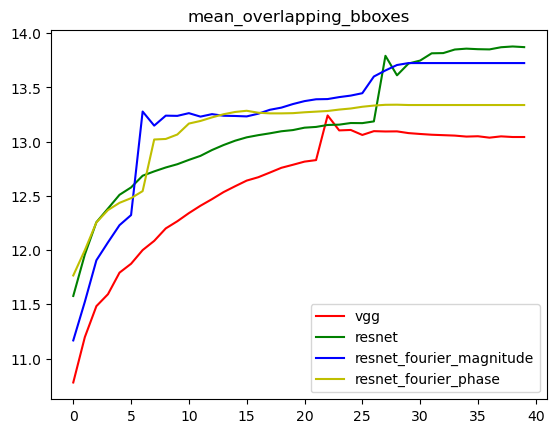

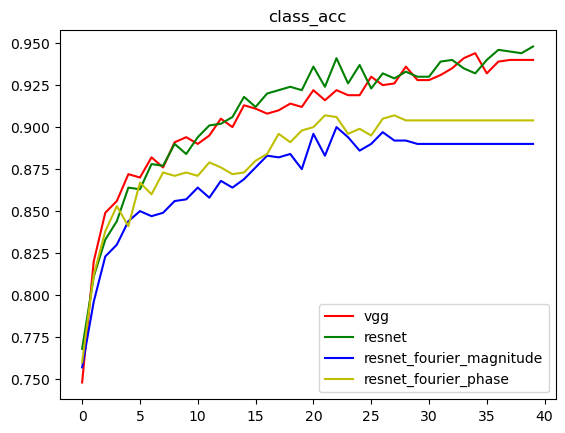

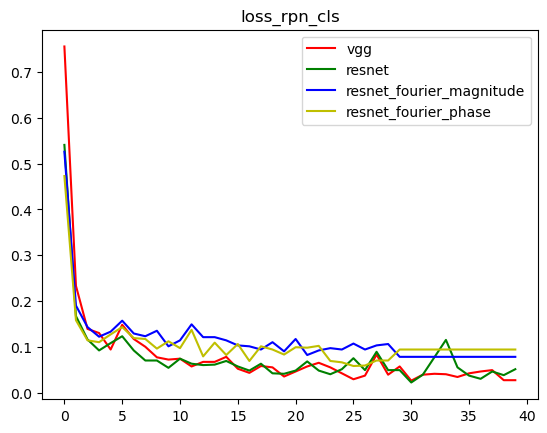

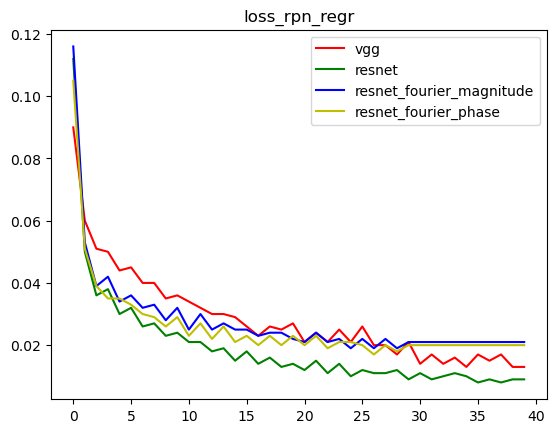

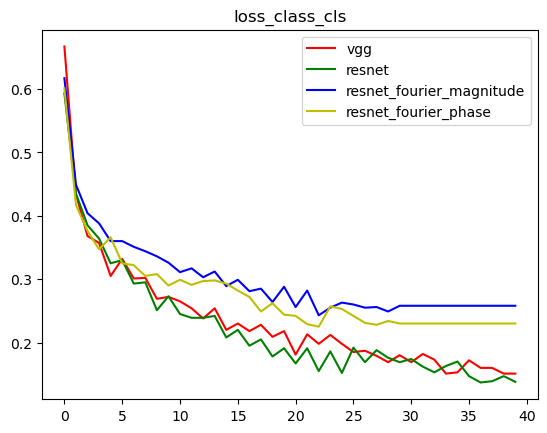

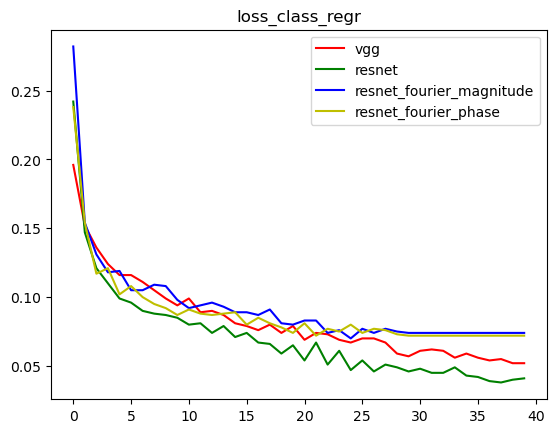

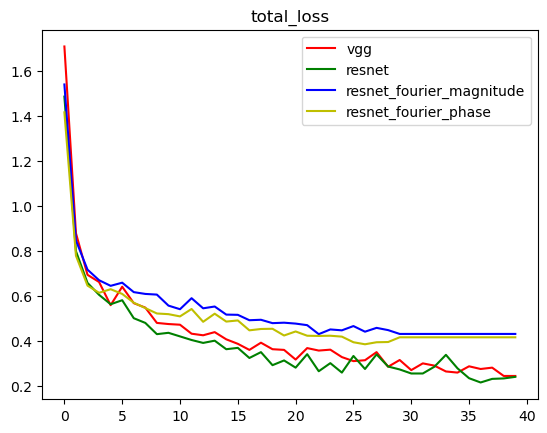

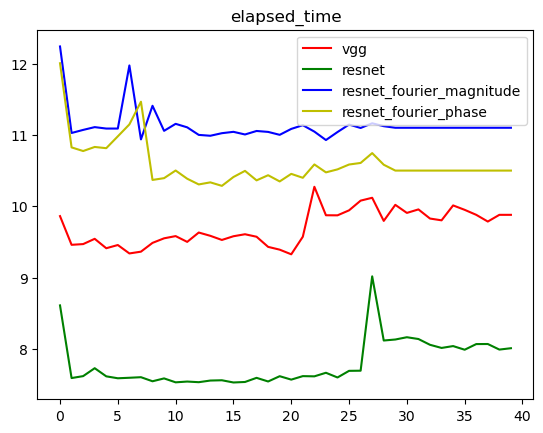

In [130]:
# Plot training progress of all models

mode = "all"

record_paths = ["model/record_vgg_640_big_anchor.csv",
				"model/record_resnet_640_big_anchor.csv",
				"model/record_resnet_640_fourier_magnitude_aug.csv",
				"model/record_resnet_640_fourier_phase_aug.csv"]

model_labels = ['vgg', 'resnet', 'resnet_fourier_magnitude', 'resnet_fourier_phase']

line_colors = ['r', 'g', 'b', 'y']

record_dfs = [pd.read_csv(record_path) for record_path in record_paths]

record_df = pd.read_csv(C.record_path)

# Get the number of epochs from the record that has the most epochs
r_epochs = max([len(record_df) for record_df in record_dfs])

def plot_multiple(title, y_label, record_dfs, model_labels, line_colors):
	for i,rdf in enumerate(record_dfs):
		line_color = line_colors[i]
		curr_label = model_labels[i]

		# If the record does not have enough epochs, repeat the last record
		if len(rdf) < r_epochs:
			for _ in range(len(rdf), r_epochs):
				rdf = pd.concat([rdf, rdf.iloc[[-1]]], ignore_index=True)

		plt.plot(np.arange(0, r_epochs), rdf[y_label], line_color, label=curr_label)

	plt.title(title)
	plt.legend()
	plt.show()

def plot_single(title, y_label, record_df):
	plt.plot(np.arange(0, r_epochs), record_df[y_label], 'r')
	plt.title(title)
	plt.show()

if mode == "all":

	plot_multiple('mean_overlapping_bboxes', 'mean_overlapping_bboxes', record_dfs, model_labels, line_colors)
	plot_multiple('class_acc', 'class_acc', record_dfs, model_labels, line_colors)
	plot_multiple('loss_rpn_cls', 'loss_rpn_cls', record_dfs, model_labels, line_colors)
	plot_multiple('loss_rpn_regr', 'loss_rpn_regr', record_dfs, model_labels, line_colors)
	plot_multiple('loss_class_cls', 'loss_class_cls', record_dfs, model_labels, line_colors)
	plot_multiple('loss_class_regr', 'loss_class_regr', record_dfs, model_labels, line_colors)
	plot_multiple('total_loss', 'curr_loss', record_dfs, model_labels, line_colors)
	plot_multiple('elapsed_time', 'elapsed_time', record_dfs, model_labels, line_colors)

# Plot the training progress of test model
else:
	plot_single('mean_overlapping_bboxes', 'mean_overlapping_bboxes', record_df)
	plot_single('class_acc', 'class_acc', record_df)
	plot_single('loss_rpn_cls', 'loss_rpn_cls', record_df)
	plot_single('loss_rpn_regr', 'loss_rpn_regr', record_df)
	plot_single('loss_class_cls', 'loss_class_cls', record_df)
	plot_single('loss_class_regr', 'loss_class_regr', record_df)
	plot_single('total_loss', 'curr_loss', record_df)
	plot_single('elapsed_time', 'elapsed_time', record_df)

# Test

## Helper Functions

In [131]:
# Hard coded classes for showing results (Change this if you want to detect other classes)
class_names = ["rebarba", "rachadura", "perfuração", "não polida", "sem defeito", "background"]
class_mapping = {"burr":0,"crack":1,"pit":2,"unpolished":3, "no_defect": 4, "bg": 5}

# Converts ground truth from (x1,y1,x2,y2) to (x,y,w,h) format
# Also converts class name to class id
# This is used by the spatial index to populate the confusion matrix
def convert_to_xywh(bbox, image_size):
	return {
		"class_id": class_mapping[bbox["class"]],
		"x_center": (bbox["x1"] + bbox["x2"]) / 2 / image_size[0],
		"y_center": (bbox["y1"] + bbox["y2"]) / 2 / image_size[1],
		"width": (bbox["x2"] - bbox["x1"]) / image_size[0],
		"height": (bbox["y2"] - bbox["y1"]) / image_size[1]
	}

# Converts predicted box from dict of lists to list of dictionaries
# Also converts box coordinates to relative coordinates
# This is used by the spatial index to populate the confusion matrix
def convert_to_list_of_dicts(pred_boxes, image_size):
	boxes = []
	
	# pred_boxes is a dict of lists for each class
	# Each list contains the predicted boxes for that class
	for class_id in pred_boxes:
		for box in pred_boxes[class_id]:
			boxes.append({
				"class_id": class_id,
				"x_center": box[0] + box[2] / 2 / image_size[0],
				"y_center": box[1] + box[3] / 2 / image_size[1],
				"width": (box[2] - box[0]) / image_size[0],
				"height": (box[3] - box[1]) / image_size[1]
			})

	return boxes

# Creates a hash map for the ground truth boxes
def create_spatial_index(boxes, grid_size, image_size):
	grid = {}
	cell_width = image_size[0] / grid_size
	cell_height = image_size[1] / grid_size
    
	for box in boxes:
		x_center = box['x_center'] * image_size[0]
		y_center = box['y_center'] * image_size[1]
		grid_x = int(x_center / cell_width)
		grid_y = int(y_center / cell_height)
        
		if (grid_x, grid_y) not in grid:
			grid[(grid_x, grid_y)] = []
		grid[(grid_x, grid_y)].append(box)
    
	return grid

def get_size_of_spatial_index(spatial_index):
	size = 0
	for cell in spatial_index:
		size += len(spatial_index[cell])
	return size

def pop_from_spatial_index(spatial_index, grid_size, image_size):
	grid = spatial_index
	cell_width = image_size[0] / grid_size
	cell_height = image_size[1] / grid_size
	cell = None
	box = None
	
	for cell in grid:
		if len(grid[cell]) > 0:
			box = grid[cell].pop()
			break
	
	return box, grid

def remove_from_spatial_index(boxes, spatial_index, grid_size, image_size):
	grid = spatial_index
	cell_width = image_size[0] / grid_size
	cell_height = image_size[1] / grid_size
	
	for box in boxes:
		x_center = box['x_center'] * image_size[0]
		y_center = box['y_center'] * image_size[1]
		grid_x = int(x_center / cell_width)
		grid_y = int(y_center / cell_height)
		
		if (grid_x, grid_y) in grid:
			grid[(grid_x, grid_y)].remove(box)
	
	return grid

def find_best_box(user_box, spatial_index, grid_size, image_size, iou_threshold):
	cell_width = image_size[0] / grid_size
	cell_height = image_size[1] / grid_size
	
	x_center = user_box['x_center'] * image_size[0]
	y_center = user_box['y_center'] * image_size[1]
	grid_x = int(x_center / cell_width)
	grid_y = int(y_center / cell_height)
	
	best_iou = 0
	best_box = None
    
	for dx in [-1, 0, 1]:
		for dy in [-1, 0, 1]:
			cell = (grid_x + dx, grid_y + dy)
			if cell in spatial_index:
				for gt_box in spatial_index[cell]:

					user_box_x1 = int((user_box["x_center"] * image_size[0] - user_box["width"] * image_size[0]) / 2)
					user_box_y1 = int((user_box["y_center"] * image_size[1] - user_box["height"] * image_size[1]) / 2)
					user_box_x2 = int((user_box["x_center"] * image_size[0] + user_box["width"] * image_size[0]) / 2)
					user_box_y2 = int((user_box["y_center"] * image_size[1] + user_box["height"] * image_size[1]) / 2)

					gt_box_x1 = int((gt_box["x_center"] * image_size[0] - gt_box["width"] * image_size[0]) / 2)
					gt_box_y1 = int((gt_box["y_center"] * image_size[1] - gt_box["height"] * image_size[1]) / 2)
					gt_box_x2 = int((gt_box["x_center"] * image_size[0] + gt_box["width"] * image_size[0]) / 2)
					gt_box_y2 = int((gt_box["y_center"] * image_size[1] + gt_box["height"] * image_size[1]) / 2)

					_iou = iou([user_box_x1, user_box_y1, user_box_x2, user_box_y2], [gt_box_x1, gt_box_y1, gt_box_x2, gt_box_y2])

					if _iou > best_iou:
						best_iou = _iou
						best_box = gt_box
    
	if best_iou < iou_threshold:
		best_box = {"class_id": 5}

	return best_iou, best_box

def populate_confusion_matrix(model_name,
								image_id,
								num_classes,
								user_boxes,
								spatial_index,
								grid_size,
								image_size,
								iou_threshold):
	"""
	Populates the confusion matrix based on predicted and ground truth boxes

	Args:
		user_boxes: list of predicted boxes
		spatial_index: hash map of ground truth boxes
		grid_size: size of the hash map grid
		iou_threshold: threshold for the intersection over union

	Returns:
		confusion_matrix: a partial confusion as a numpy 2D array
		cumulative_precision: precision so far for each class
		cumulative_recall: recall so far for each class
	"""
	bbox_mapping = []
	conf_mat = np.zeros((num_classes, num_classes))

	cumulative_precision = [ [] for _ in range(num_classes) ]
	cumulative_recall = [ [] for _ in range(num_classes) ]

	for user_box in user_boxes:
		best_iou, best_box = find_best_box(user_box, spatial_index, grid_size, image_size, iou_threshold)

		# DEBUG
		# print(f"Box matching with IoU@{iou_threshold}:")
		# print("Pred box: ", user_box)
		# print("Best GT: ", best_box)
		# print("Best IOU: ", best_iou)
		
		# remove the best box from the spatial index
		if best_box is not None and best_iou >= iou_threshold:
			spatial_index = remove_from_spatial_index([best_box], spatial_index, grid_size, image_size)

		conf_mat[int(user_box['class_id'])][int(best_box['class_id'])] += 1

		acerto = 1 if int(best_box['class_id']) == int(user_box['class_id']) else 0

		if best_box['class_id'] == 5:
			bbox_mapping.append((user_box, None, best_iou))
		else:
			bbox_mapping.append((user_box, best_box, best_iou))

		last_edited = 0 # Machines will predict sequentially and don't get tired with time, no need to keep track last edited timestamp

		with open(f"scores/{model_name}/anotacoes@{iou_threshold}.csv", "a") as f:
			writer = csv.writer(f)
			writer.writerow([image_id, class_names[int(best_box['class_id'])], class_names[int(user_box['class_id'])], acerto, best_iou, last_edited])

			
	while get_size_of_spatial_index(spatial_index) > 0:
		box, _ = pop_from_spatial_index(spatial_index, grid_size, image_size)
		acerto = 0
		last_edited = 0

		conf_mat[5][int(box['class_id'])] += 1

		bbox_mapping.append((None, box, None))

		with open(f"scores/{model_name}/anotacoes@{iou_threshold}.csv", "a") as f:
			writer = csv.writer(f)
			writer.writerow([image_id, class_names[int(box['class_id'])], "N/A", acerto, 0, last_edited])

	return conf_mat, bbox_mapping

# Calculates the area under the curve using a Riemann sum All point interpolation
def calculate_ap(precision, recall):
	ap = 0

	if len(recall) == 0: return 0
	
	precision.insert(0, 1.0)
	recall.insert(0, 0.0)

	precision.append(0.0)
	recall.append(recall[-1])
	
	for i in range(0, len(recall) - 1):
		ap += (recall[i+1] - recall[i]) * precision[i]
	return ap

	


## Inference and Evaluation

In [132]:
all_data, classes_count, class_mapping = get_data(test_path)

if 'bg' not in classes_count:
	classes_count['bg'] = 0
	class_mapping['bg'] = len(class_mapping)
	
print(len(all_data))
print(classes_count)
print(class_mapping)

Parsing annotation files
110
{'unpolished': 26, 'crack': 41, 'pit': 28, 'burr': 9, 'no_defect': 45, 'bg': 0}
{'burr': 0, 'crack': 1, 'pit': 2, 'unpolished': 3, 'no_defect': 4, 'bg': 5}


In [133]:
def format_img_size(img, C):
	""" formats the image size based on config """
	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
		
	if width <= height:
		ratio = img_min_side/width
		new_height = int(ratio * height)
		new_width = int(img_min_side)
	else:
		ratio = img_min_side/height
		new_width = int(ratio * width)
		new_height = int(img_min_side)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	return img, ratio	

def format_img_channels(img, C):
	""" formats the image channels based on config """
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	img = np.transpose(img, (2, 0, 1))
	img = np.expand_dims(img, axis=0)
	return img

def format_img(img, C):
	""" formats an image for model prediction based on config """
	img, ratio = format_img_size(img, C)
	img = format_img_channels(img, C)
	return img, ratio

# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

	real_x1 = int(round(x1 // ratio))
	real_y1 = int(round(y1 // ratio))
	real_x2 = int(round(x2 // ratio))
	real_y2 = int(round(y2 // ratio))

	return (real_x1, real_y1, real_x2 ,real_y2)

In [134]:

if C.network == 'vgg':
	num_features = 512
else:
	num_features = 1024

input_shape_img = (None, None, 3)
input_shape_features = (None, None, num_features)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(C.num_rois, 4))
feature_map_input = Input(shape=input_shape_features)

# define the base network (VGG here, can be Resnet50, Inception, etc)
if C.network == 'vgg':
	shared_layers = nn_base(img_input, trainable=False)
else:
	shared_layers = nn_base_resnet(img_input, trainable=False)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios) # 9	

if C.network == 'vgg':
	rpn_layers = rpn_layer(shared_layers, num_anchors)
	classifier = classifier_layer(feature_map_input, roi_input, C.num_rois, nb_classes=len(class_mapping))
else:
	rpn_layers = rpn_resnet(shared_layers, num_anchors)
	classifier = classifier_resnet(feature_map_input, roi_input, C.num_rois, nb_classes=len(class_mapping))

model_rpn = Model(img_input, rpn_layers)
model_classifier_only = Model([feature_map_input, roi_input], classifier)

model_classifier = Model([feature_map_input, roi_input], classifier)

print('Loading weights from {}'.format(C.model_path))
model_rpn.load_weights(C.model_path, by_name=True)
model_classifier.load_weights(C.model_path, by_name=True)

model_rpn.compile(optimizer='sgd', loss='mse')
model_classifier.compile(optimizer='sgd', loss='mse')

Roi pool shape:  (1, 4, 14, 14, 1024)
Loading weights from model/model_frcnn_resnet_640_big_anchor.h5


In [135]:
inv_mapping = {v: k for k, v in class_mapping.items()}
class_to_color = {inv_mapping[v]: np.random.randint(0, 255, 3) for v in inv_mapping}

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1019_jpeg.rf.c96a3513d835c3d9bedd9c2dbd697f61.jpg
Inference time = 17.086661338806152
Metric Calculation time = 0.027300357818603516
[{'class_id': 3, 'x_center': 0.5, 'y_center': 0.5, 'width': 0.75, 'height': 0.8, 'confidence': 99.9826729297638}, {'class_id': 1, 'x_center': 0.2625, 'y_center': 0.6625, 'width': 0.075, 'height': 0.075, 'confidence': 96.15378379821777}]
[{'class_id': 3, 'x_center': 0.4859375, 'y_center': 0.50703125, 'width': 0.80625, 'height': 0.8296875}, {'class_id': 1, 'x_center': 0.28203125, 'y_center': 0.6796875, 'width': 0.1015625, 'height': 0.090625}]
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  1.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  1.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  0.0  


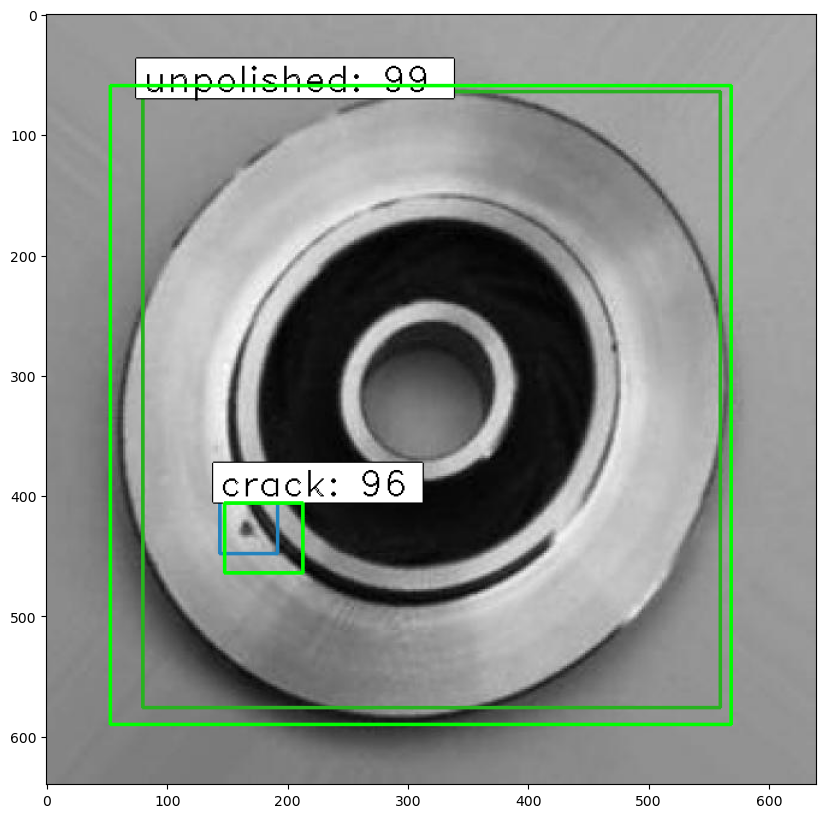

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1139_jpeg.rf.5ac61906a0502e1fd2ee6b486e6e2b24.jpg
Inference time = 12.357753992080688
Metric Calculation time = 0.0059986114501953125
[{'class_id': 4, 'x_center': 0.5375, 'y_center': 0.5, 'width': 0.825, 'height': 0.9, 'confidence': 99.97889399528503}]
[{'class_id': 2, 'x_center': 0.37265625, 'y_center': 0.134375, 'width': 0.0421875, 'height': 0.03125}]
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  1.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  1.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  1.0  
0.0  0.0  1.0  0.0  0.0  0.0  


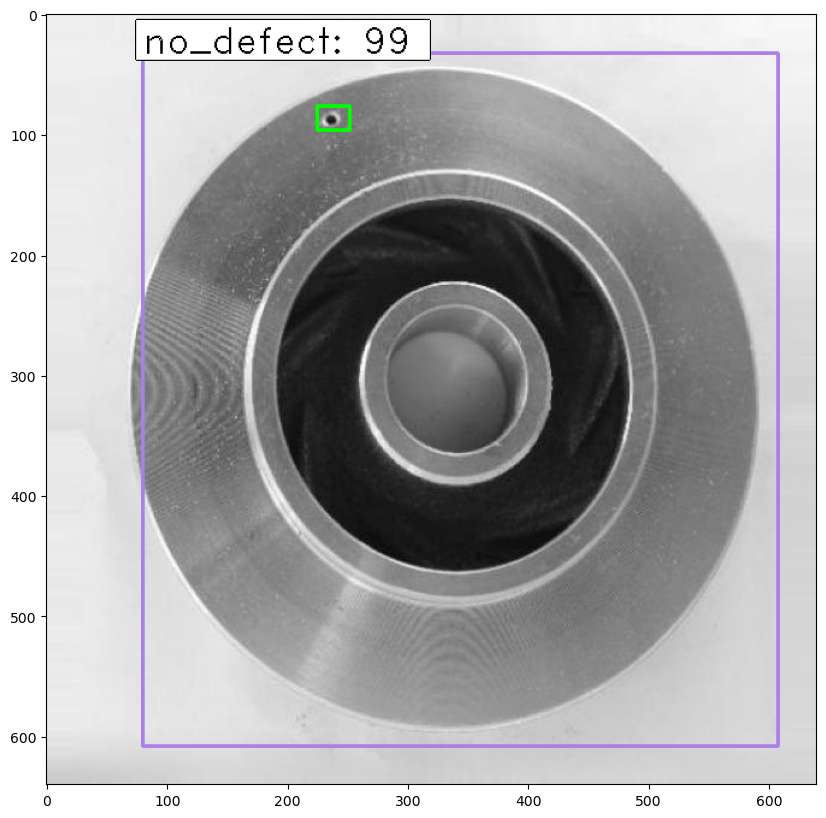

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1225_jpeg.rf.f4f5e755ddf8942877eab865162c07c5.jpg
Inference time = 12.201130390167236
Metric Calculation time = 0.00450444221496582
[{'class_id': 3, 'x_center': 0.5, 'y_center': 0.5125, 'width': 0.8, 'height': 0.775, 'confidence': 99.99843835830688}, {'class_id': 1, 'x_center': 0.6625, 'y_center': 0.2875, 'width': 0.075, 'height': 0.075, 'confidence': 82.64904618263245}]
[{'class_id': 1, 'x_center': 0.66796875, 'y_center': 0.284375, 'width': 0.0703125, 'height': 0.059375}, {'class_id': 3, 'x_center': 0.5078125, 'y_center': 0.50625, 'width': 0.8375, 'height': 0.846875}]
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  2.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  2.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  1.0  
0.0  0.0  1.0  0.0  0.0  0.0  


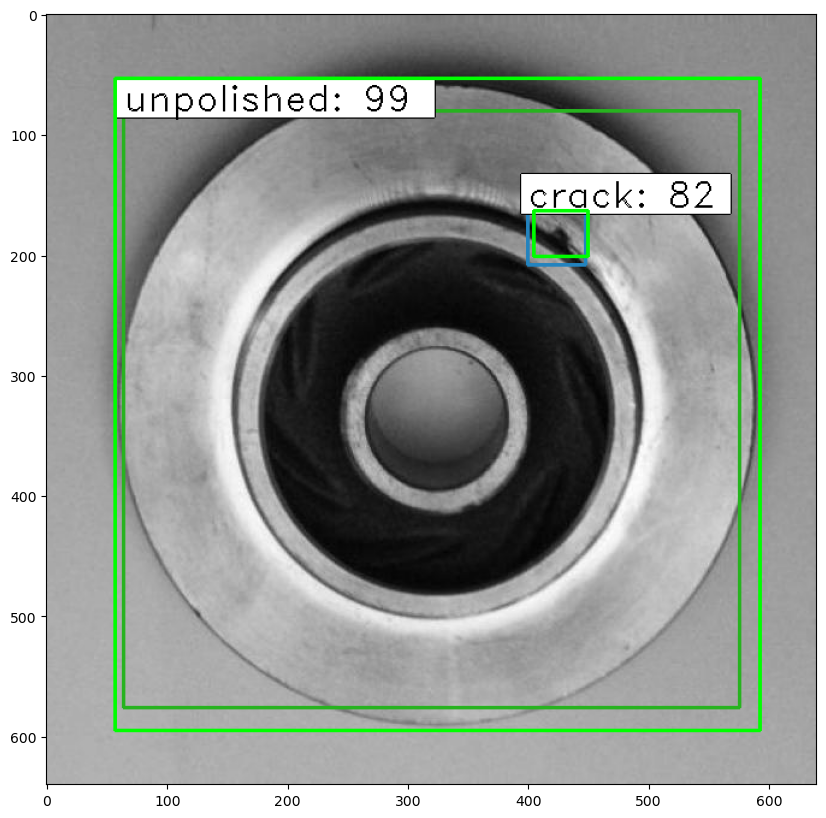

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1313_jpeg.rf.c368f21a9af4e929774b74d999889af8.jpg
Inference time = 11.780201435089111
Metric Calculation time = 0.0065152645111083984
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.4875, 'width': 0.875, 'height': 0.875, 'confidence': 99.98692274093628}, {'class_id': 2, 'x_center': 0.4375, 'y_center': 0.2, 'width': 0.075, 'height': 0.05, 'confidence': 92.93450713157654}]
[{'class_id': 3, 'x_center': 0.49609375, 'y_center': 0.49296875, 'width': 0.8921875, 'height': 0.8953125}, {'class_id': 1, 'x_center': 0.44765625, 'y_center': 0.203125, 'width': 0.0796875, 'height': 0.059375}, {'class_id': 1, 'x_center': 0.70703125, 'y_center': 0.29765625, 'width': 0.0859375, 'height': 0.0671875}]
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  2.0  0.0  0.0  0.0  0.0  
0.0  1.0  0.0  0.0  0.0  0.0  
0.0  0.0  0.0  3.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  1.0  
0.0  1.0  1.0  0.0  0.0  0.0  


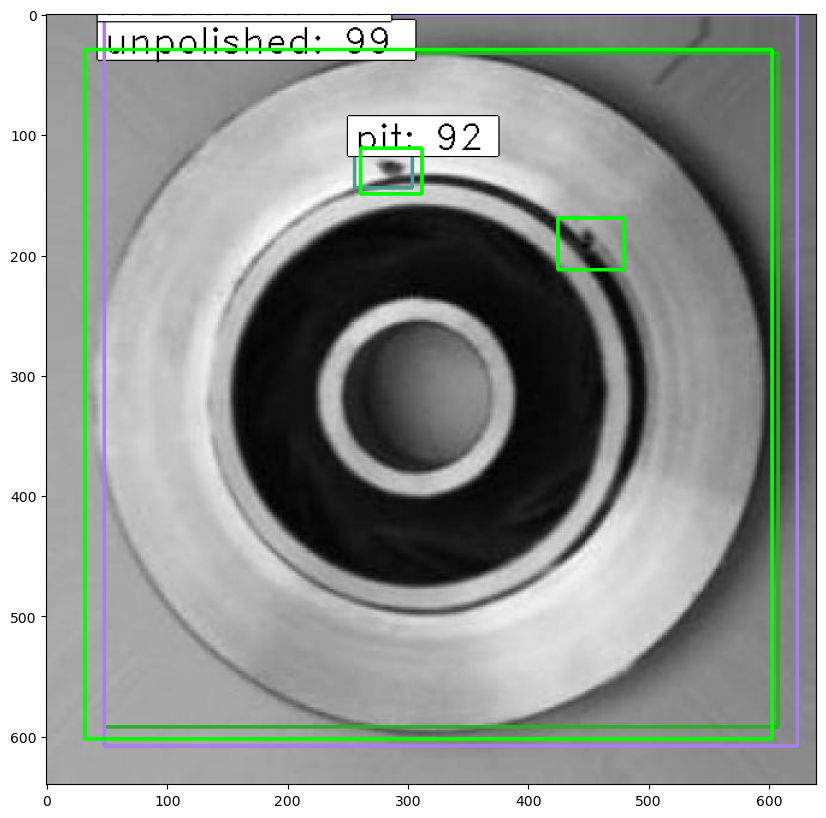

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_138_jpeg.rf.611379c4d69f5f37706b0d18ba61aebc.jpg
Inference time = 12.198948621749878
Metric Calculation time = 0.005002737045288086
[{'class_id': 4, 'x_center': 0.5125, 'y_center': 0.5, 'width': 0.925, 'height': 0.9, 'confidence': 99.99514818191528}, {'class_id': 2, 'x_center': 0.1375, 'y_center': 0.8, 'width': 0.075, 'height': 0.05, 'confidence': 95.65379023551941}]
[{'class_id': 2, 'x_center': 0.1390625, 'y_center': 0.80703125, 'width': 0.05, 'height': 0.0578125}]
0.0  0.0  0.0  0.0  0.0  0.0  
0.0  2.0  0.0  0.0  0.0  0.0  
0.0  1.0  1.0  0.0  0.0  0.0  
0.0  0.0  0.0  3.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  2.0  
0.0  1.0  1.0  0.0  0.0  0.0  


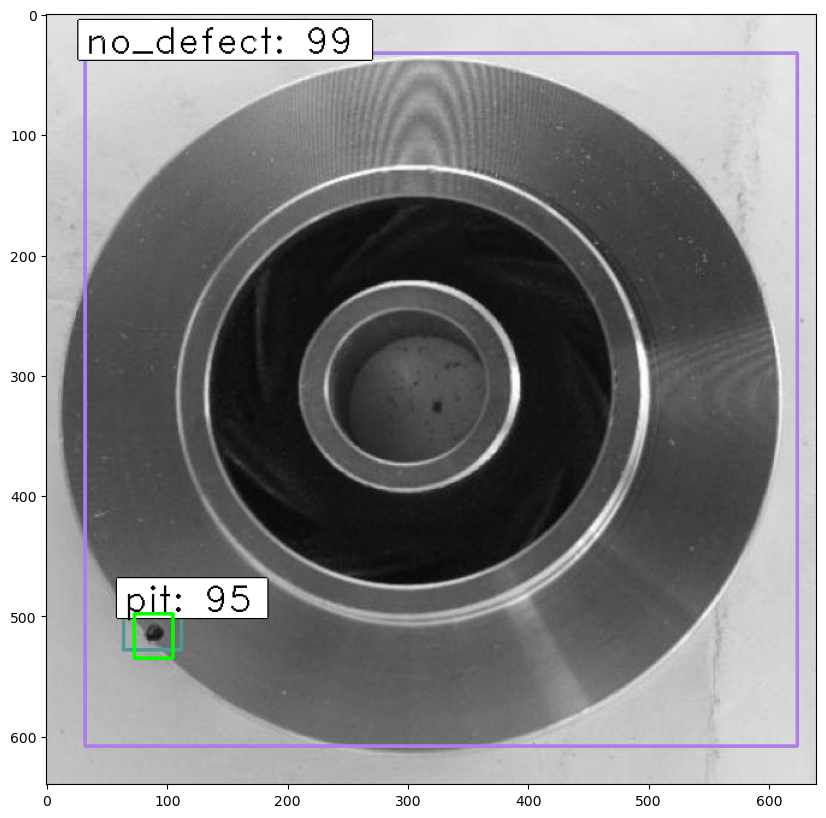

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1728_jpeg.rf.c4f8eba1b4fede32163ba146a851427b.jpg
Inference time = 11.815183162689209
Metric Calculation time = 0.003971099853515625
[{'class_id': 0, 'x_center': 0.5, 'y_center': 0.5375, 'width': 0.85, 'height': 0.825, 'confidence': 99.99566078186035}, {'class_id': 1, 'x_center': 0.7625, 'y_center': 0.4, 'width': 0.075, 'height': 0.1, 'confidence': 96.39909863471985}]
[{'class_id': 0, 'x_center': 0.49765625, 'y_center': 0.503125, 'width': 0.8765625, 'height': 0.884375}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  2.0  0.0  0.0  0.0  1.0  
0.0  1.0  1.0  0.0  0.0  0.0  
0.0  0.0  0.0  3.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  2.0  
0.0  1.0  1.0  0.0  0.0  0.0  


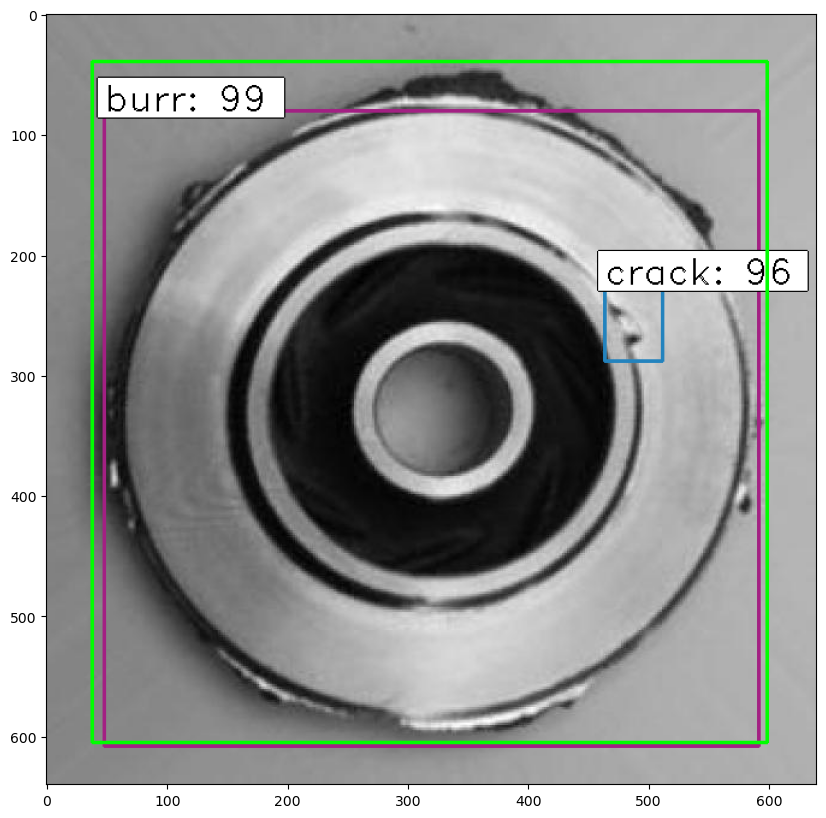

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1778_jpeg.rf.84fce609adc9552561b3d4de82db20f4.jpg
Inference time = 12.007213115692139
Metric Calculation time = 0.004997968673706055
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.4875, 'width': 0.825, 'height': 0.825, 'confidence': 99.98433589935303}, {'class_id': 2, 'x_center': 0.275, 'y_center': 0.8375, 'width': 0.1, 'height': 0.075, 'confidence': 95.23783922195435}]
[{'class_id': 3, 'x_center': 0.48828125, 'y_center': 0.5, 'width': 0.8484375, 'height': 0.840625}, {'class_id': 2, 'x_center': 0.271875, 'y_center': 0.82734375, 'width': 0.1, 'height': 0.0734375}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  2.0  0.0  0.0  0.0  1.0  
0.0  1.0  2.0  0.0  0.0  0.0  
0.0  0.0  0.0  4.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  2.0  
0.0  1.0  1.0  0.0  0.0  0.0  


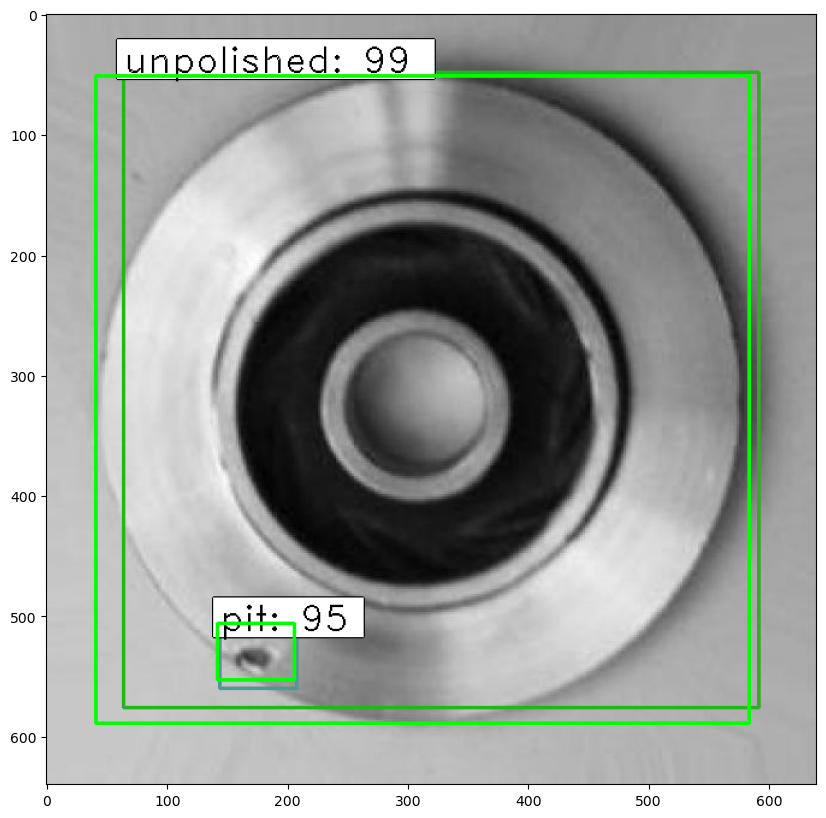

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1784_jpeg.rf.1f358ab882e4fdb193240413c1a4f082.jpg
Inference time = 12.300565481185913
Metric Calculation time = 0.008008956909179688
[{'class_id': 3, 'x_center': 0.525, 'y_center': 0.5125, 'width': 0.8, 'height': 0.875, 'confidence': 99.98325109481812}, {'class_id': 1, 'x_center': 0.7625, 'y_center': 0.375, 'width': 0.075, 'height': 0.05, 'confidence': 98.73186945915222}]
[{'class_id': 1, 'x_center': 0.75859375, 'y_center': 0.3765625, 'width': 0.0453125, 'height': 0.053125}, {'class_id': 3, 'x_center': 0.5234375, 'y_center': 0.5015625, 'width': 0.828125, 'height': 0.890625}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  0.0  0.0  0.0  1.0  
0.0  1.0  2.0  0.0  0.0  0.0  
0.0  0.0  0.0  5.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  2.0  
0.0  1.0  1.0  0.0  0.0  0.0  


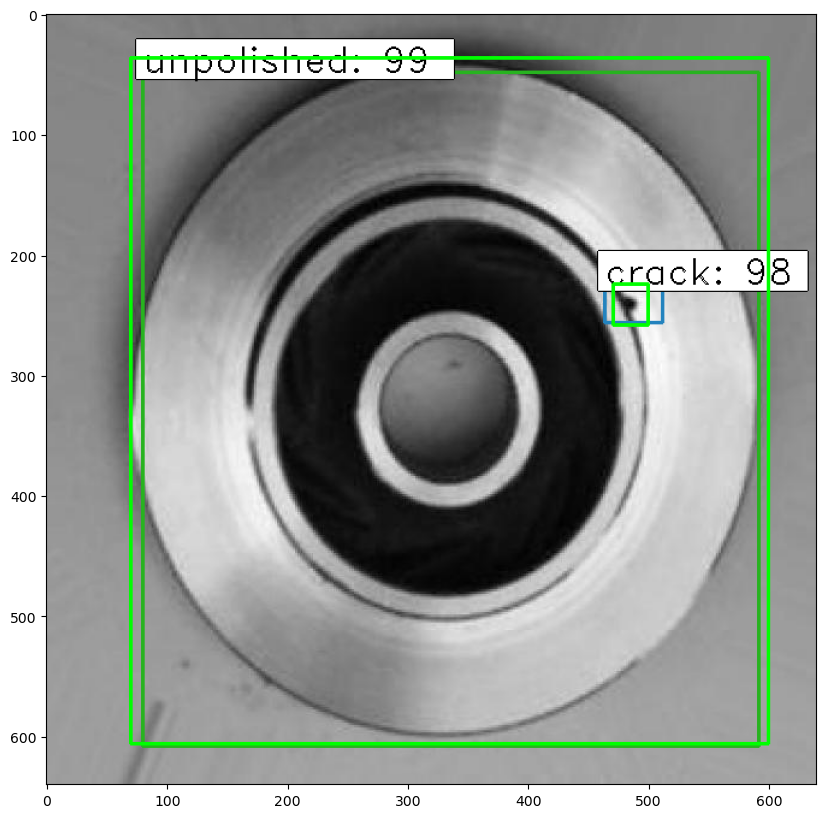

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_1849_jpeg.rf.06d1217ac7fd2307c75b265f94ff2e48.jpg
Inference time = 12.062098026275635
Metric Calculation time = 0.0041048526763916016
[{'class_id': 4, 'x_center': 0.525, 'y_center': 0.5125, 'width': 0.85, 'height': 0.875, 'confidence': 99.99772310256958}]
[{'class_id': 2, 'x_center': 0.8390625, 'y_center': 0.19765625, 'width': 0.0375, 'height': 0.0578125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  0.0  0.0  0.0  1.0  
0.0  1.0  2.0  0.0  0.0  0.0  
0.0  0.0  0.0  5.0  0.0  0.0  
0.0  0.0  0.0  0.0  0.0  3.0  
0.0  1.0  2.0  0.0  0.0  0.0  


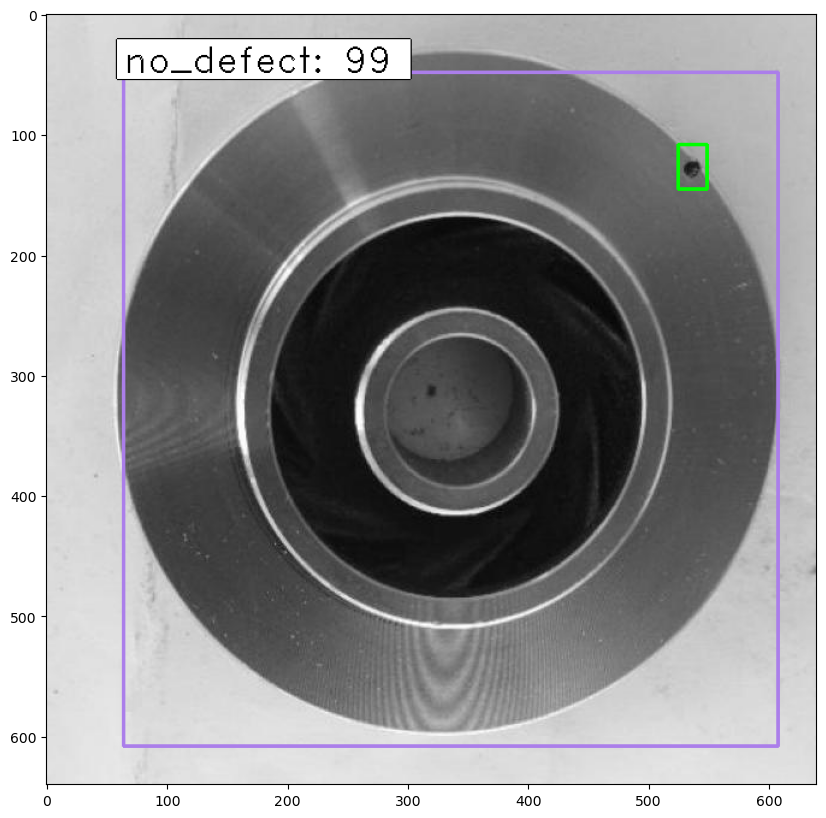

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2010_jpeg.rf.be75792dfa1625cb574b9fc9d44b5ba0.jpg
Inference time = 12.184543371200562
Metric Calculation time = 0.006000041961669922
[{'class_id': 3, 'x_center': 0.5375, 'y_center': 0.4875, 'width': 0.775, 'height': 0.825, 'confidence': 99.98959302902222}, {'class_id': 1, 'x_center': 0.25, 'y_center': 0.6, 'width': 0.05, 'height': 0.05, 'confidence': 82.37239122390747}]
[{'class_id': 2, 'x_center': 0.259375, 'y_center': 0.609375, 'width': 0.06875, 'height': 0.071875}, {'class_id': 1, 'x_center': 0.290625, 'y_center': 0.8296875, 'width': 0.146875, 'height': 0.121875}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  1.0  0.0  0.0  1.0  
0.0  1.0  2.0  0.0  0.0  0.0  
0.0  0.0  0.0  5.0  0.0  1.0  
0.0  0.0  0.0  0.0  0.0  3.0  
0.0  2.0  2.0  0.0  0.0  0.0  


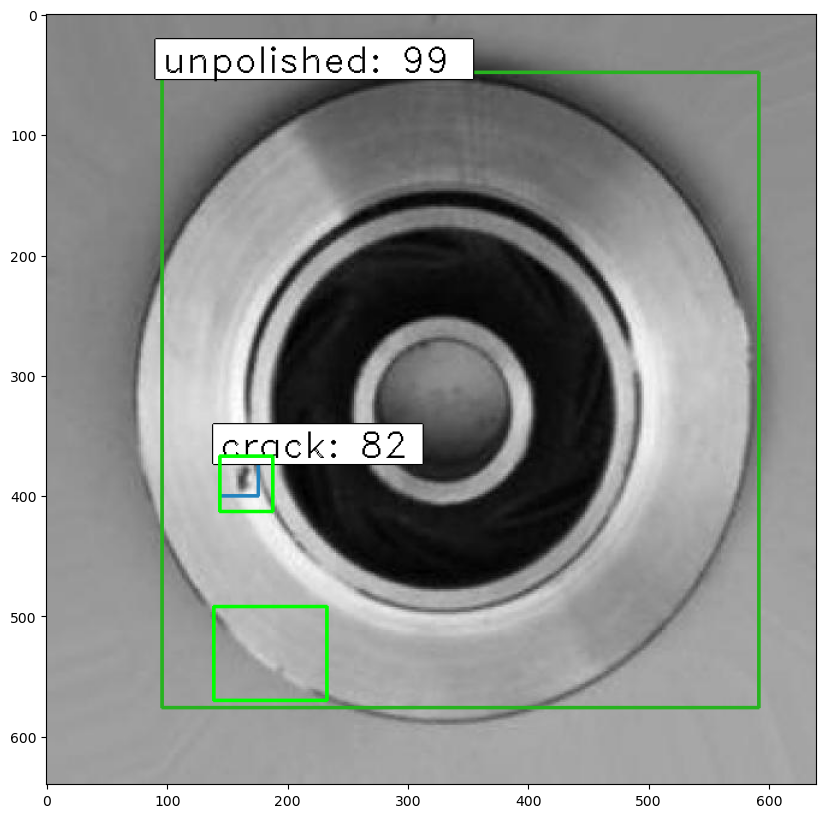

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2057_jpeg.rf.d868a313022dfcfbb26b8b2e6d0f5dbb.jpg
Inference time = 12.935577630996704
Metric Calculation time = 0.006120443344116211
[{'class_id': 4, 'x_center': 0.5375, 'y_center': 0.4875, 'width': 0.775, 'height': 0.925, 'confidence': 99.91551637649536}, {'class_id': 2, 'x_center': 0.525, 'y_center': 0.025, 'width': 0.05, 'height': 0.05, 'confidence': 99.89144802093506}]
[{'class_id': 2, 'x_center': 0.52421875, 'y_center': 0.0328125, 'width': 0.0609375, 'height': 0.059375}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  1.0  0.0  0.0  1.0  
0.0  1.0  3.0  0.0  0.0  0.0  
0.0  0.0  0.0  5.0  0.0  1.0  
0.0  0.0  0.0  0.0  0.0  4.0  
0.0  2.0  2.0  0.0  0.0  0.0  


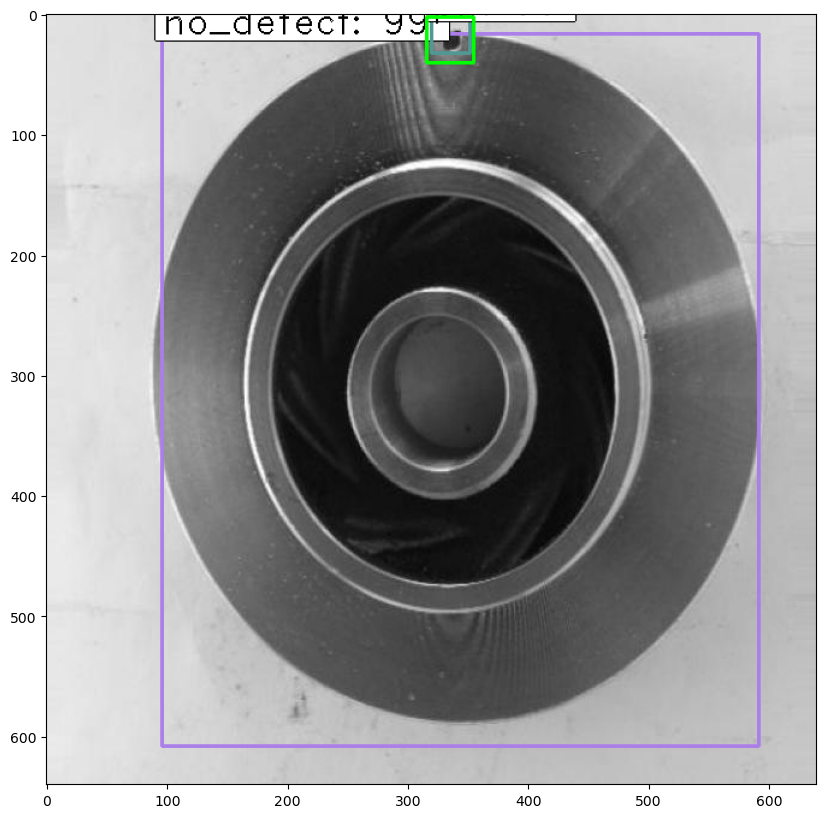

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2437_jpeg.rf.a966c95fb50ddbd585a86a533918f199.jpg
Inference time = 12.186257123947144
Metric Calculation time = 0.005524396896362305
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.4625, 'width': 0.825, 'height': 0.925, 'confidence': 99.93728995323181}, {'class_id': 2, 'x_center': 0.1625, 'y_center': 0.725, 'width': 0.075, 'height': 0.1, 'confidence': 99.630606174469}]
[{'class_id': 2, 'x_center': 0.15390625, 'y_center': 0.7171875, 'width': 0.1046875, 'height': 0.115625}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  1.0  0.0  0.0  1.0  
0.0  1.0  4.0  0.0  0.0  0.0  
0.0  0.0  0.0  5.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  4.0  
0.0  2.0  2.0  0.0  0.0  0.0  


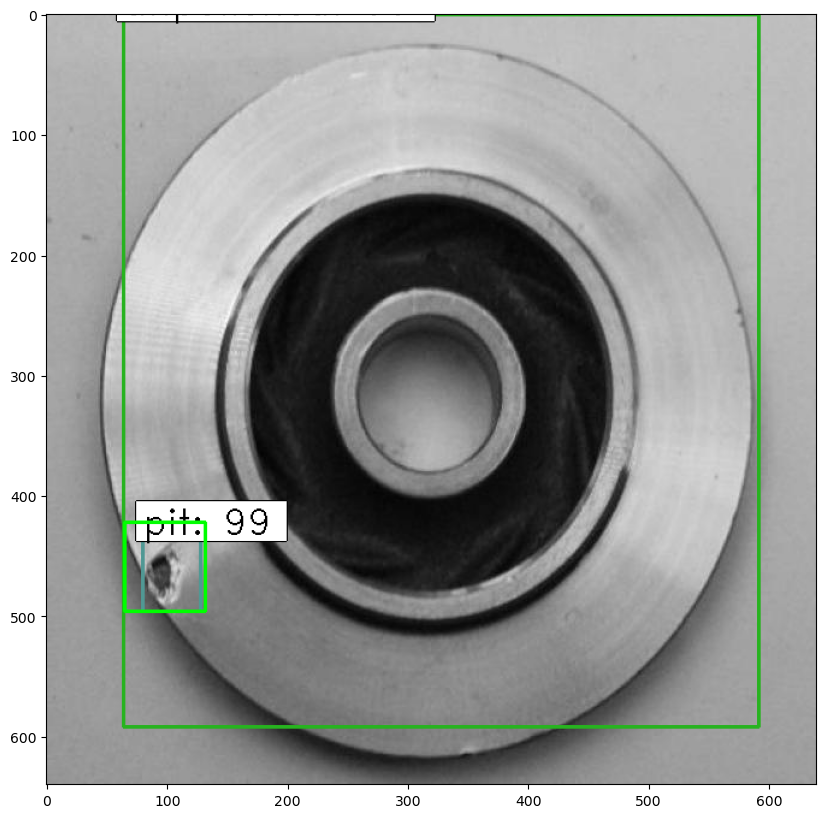

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2641_jpeg.rf.c3c9283e26c7cdcfeb16877d5c280341.jpg
Inference time = 12.48512601852417
Metric Calculation time = 0.006899356842041016
[{'class_id': 3, 'x_center': 0.4875, 'y_center': 0.4875, 'width': 0.875, 'height': 0.825, 'confidence': 99.96590614318848}]
[{'class_id': 3, 'x_center': 0.459375, 'y_center': 0.48828125, 'width': 0.8875, 'height': 0.8578125}, {'class_id': 1, 'x_center': 0.55546875, 'y_center': 0.090625, 'width': 0.0921875, 'height': 0.084375}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  3.0  1.0  0.0  0.0  1.0  
0.0  1.0  4.0  0.0  0.0  0.0  
0.0  0.0  0.0  6.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  4.0  
0.0  3.0  2.0  0.0  0.0  0.0  


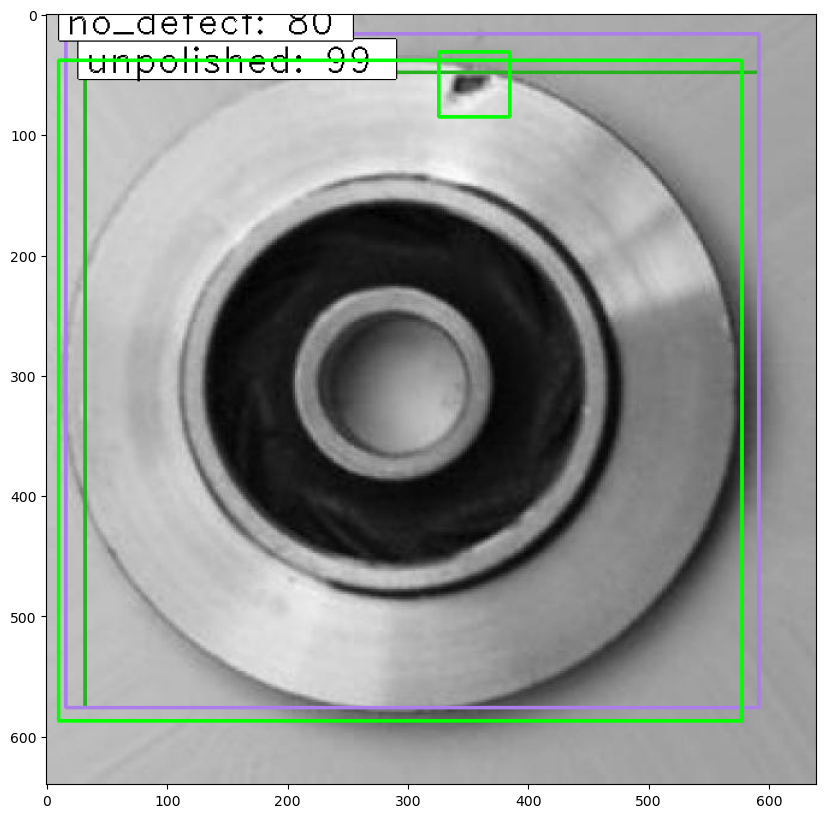

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2950_jpeg.rf.0ad9c4bff9dcb6431226be1351f7ed13.jpg
Inference time = 12.429919004440308
Metric Calculation time = 0.00530242919921875
[{'class_id': 4, 'x_center': 0.5125, 'y_center': 0.4875, 'width': 0.775, 'height': 0.775, 'confidence': 99.96843338012695}, {'class_id': 1, 'x_center': 0.7375, 'y_center': 0.7625, 'width': 0.075, 'height': 0.075, 'confidence': 98.55595827102661}]
[{'class_id': 1, 'x_center': 0.74921875, 'y_center': 0.76640625, 'width': 0.0796875, 'height': 0.0578125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  1.0  0.0  0.0  1.0  
0.0  1.0  4.0  0.0  0.0  0.0  
0.0  0.0  0.0  6.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  5.0  
0.0  3.0  2.0  0.0  0.0  0.0  


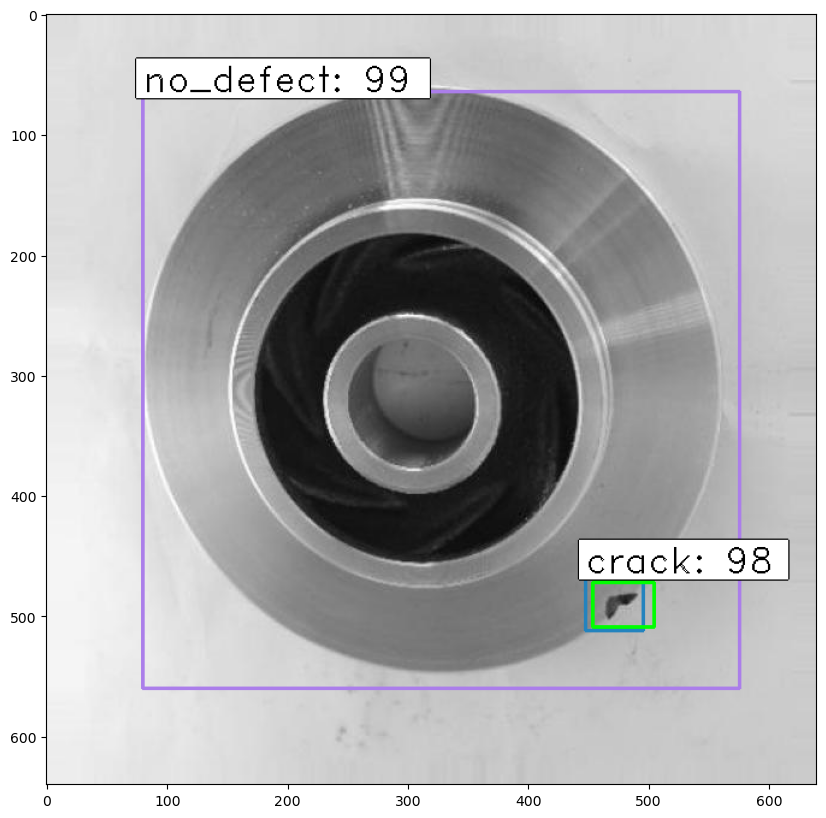

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2994_jpeg.rf.389183bc79926bc999f6f1d3441e9769.jpg
Inference time = 12.147186040878296
Metric Calculation time = 0.006491184234619141
[{'class_id': 4, 'x_center': 0.5375, 'y_center': 0.5125, 'width': 0.925, 'height': 0.975, 'confidence': 99.99449253082275}, {'class_id': 2, 'x_center': 0.9, 'y_center': 0.425, 'width': 0.05, 'height': 0.05, 'confidence': 96.30794525146484}]
[{'class_id': 2, 'x_center': 0.9109375, 'y_center': 0.42578125, 'width': 0.040625, 'height': 0.0640625}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  1.0  0.0  0.0  1.0  
0.0  1.0  5.0  0.0  0.0  0.0  
0.0  0.0  0.0  6.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  6.0  
0.0  3.0  2.0  0.0  0.0  0.0  


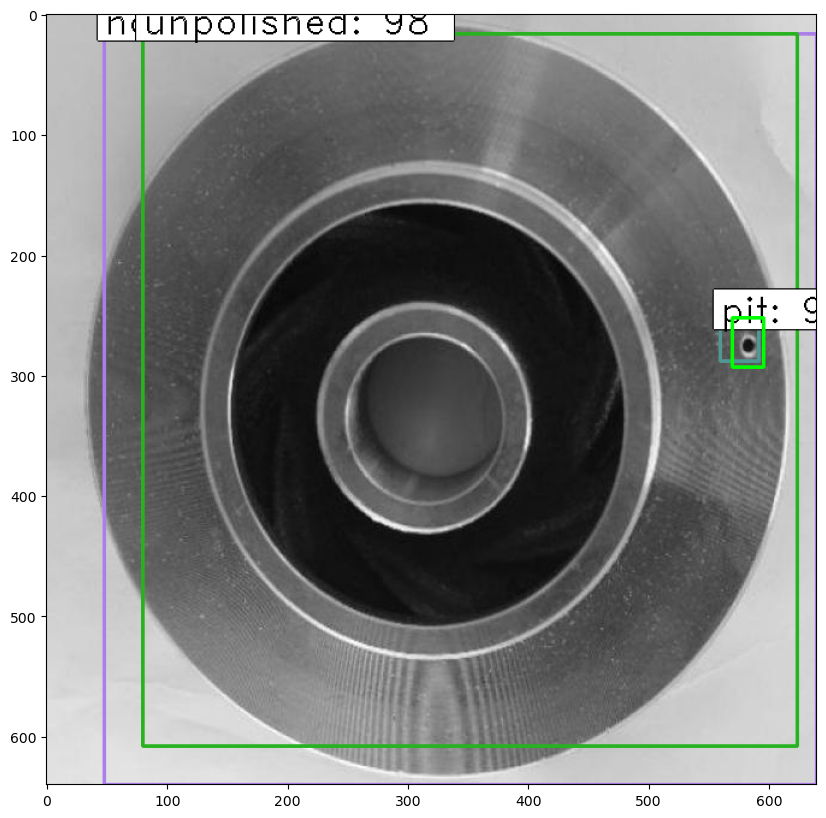

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_2_jpeg.rf.e25025925940cb327c586f764881fcf0.jpg
Inference time = 11.879120588302612
Metric Calculation time = 0.006085634231567383
[{'class_id': 4, 'x_center': 0.525, 'y_center': 0.55, 'width': 0.85, 'height': 0.9, 'confidence': 99.94407296180725}, {'class_id': 2, 'x_center': 0.275, 'y_center': 0.225, 'width': 0.05, 'height': 0.05, 'confidence': 99.56556558609009}]
[{'class_id': 2, 'x_center': 0.28359375, 'y_center': 0.2328125, 'width': 0.0390625, 'height': 0.0375}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  1.0  0.0  0.0  1.0  
0.0  1.0  6.0  0.0  0.0  0.0  
0.0  0.0  0.0  6.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  3.0  2.0  0.0  0.0  0.0  


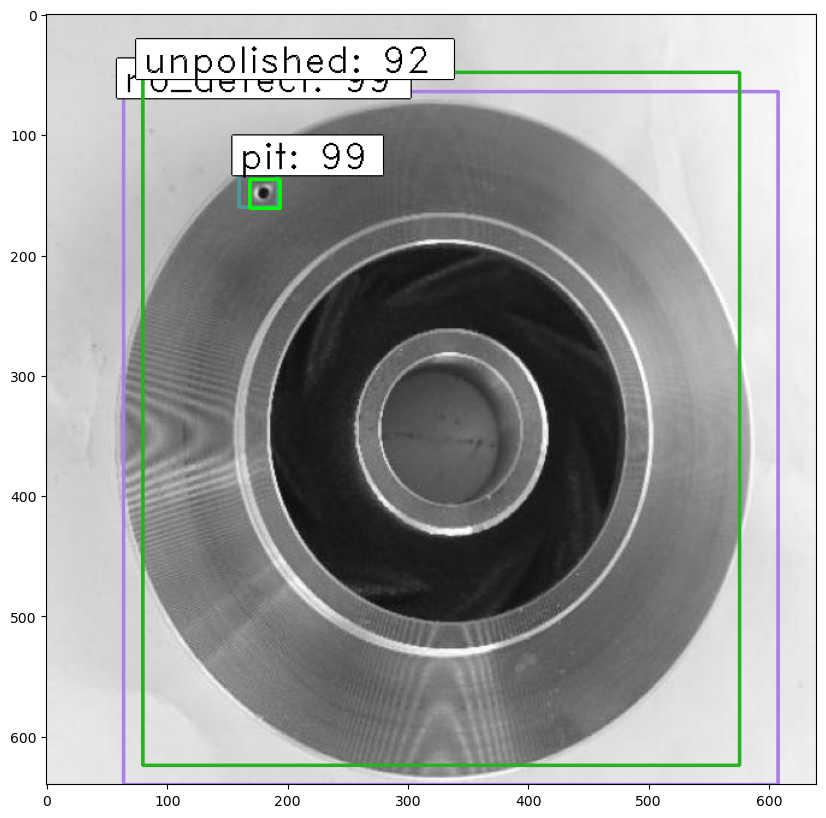

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_323_jpeg.rf.f35e3f940bd390bbb8aafcd45db75f7c.jpg
Inference time = 13.754574298858643
Metric Calculation time = 0.006128549575805664
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.475, 'width': 0.825, 'height': 0.85, 'confidence': 99.98997449874878}, {'class_id': 2, 'x_center': 0.275, 'y_center': 0.7875, 'width': 0.1, 'height': 0.075, 'confidence': 97.23237156867981}]
[{'class_id': 3, 'x_center': 0.51875, 'y_center': 0.471875, 'width': 0.865625, 'height': 0.825}, {'class_id': 2, 'x_center': 0.2734375, 'y_center': 0.7765625, 'width': 0.09375, 'height': 0.1125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  1.0  0.0  0.0  1.0  
0.0  1.0  7.0  0.0  0.0  0.0  
0.0  0.0  0.0  7.0  0.0  2.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  3.0  2.0  0.0  0.0  0.0  


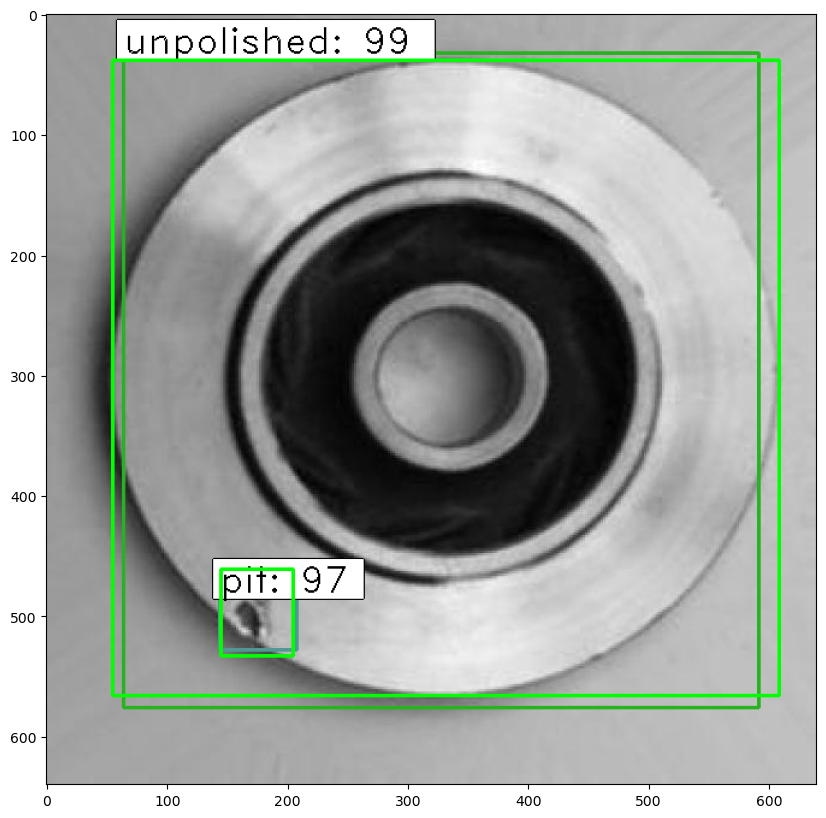

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_3434_jpeg.rf.14f324bff1d94c7613aed2170268de36.jpg
Inference time = 12.800260305404663
Metric Calculation time = 0.007611513137817383
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.4875, 'width': 0.775, 'height': 0.875, 'confidence': 99.854975938797}, {'class_id': 1, 'x_center': 0.7, 'y_center': 0.2625, 'width': 0.1, 'height': 0.075, 'confidence': 94.15826797485352}]
[{'class_id': 2, 'x_center': 0.7125, 'y_center': 0.27734375, 'width': 0.06875, 'height': 0.0796875}, {'class_id': 1, 'x_center': 0.25703125, 'y_center': 0.5734375, 'width': 0.0328125, 'height': 0.06875}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  2.0  0.0  0.0  1.0  
0.0  1.0  7.0  0.0  0.0  0.0  
0.0  0.0  0.0  7.0  0.0  3.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  2.0  0.0  0.0  0.0  


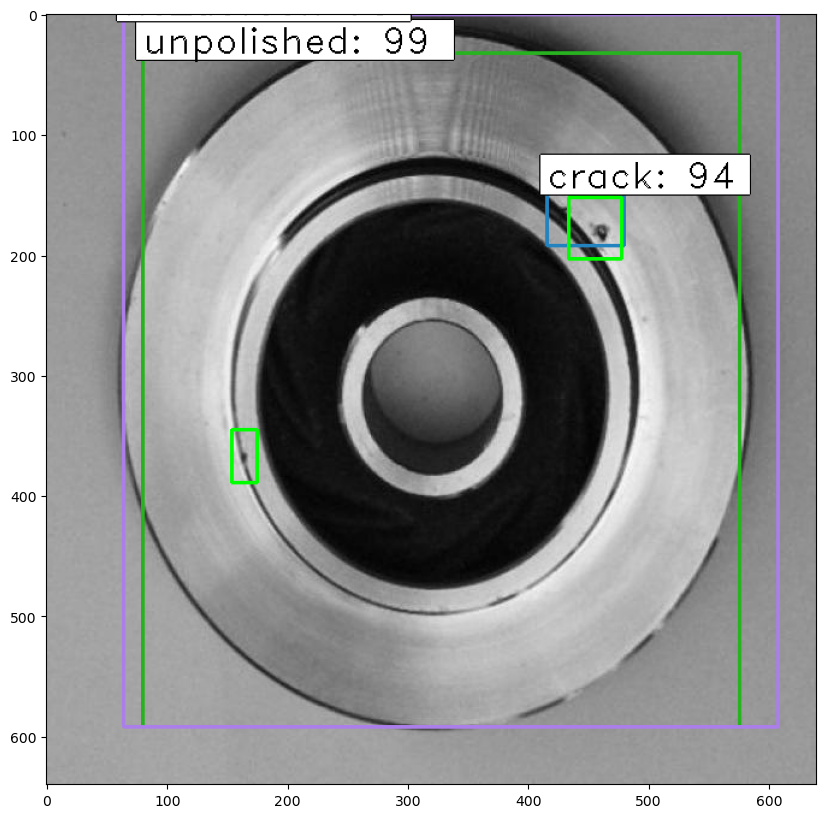

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_3544_jpeg.rf.7ff1ef44bacc888e7b2693884200123a.jpg
Inference time = 11.752412796020508
Metric Calculation time = 0.004528522491455078
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.5, 'width': 0.875, 'height': 0.85, 'confidence': 99.9576985836029}, {'class_id': 2, 'x_center': 0.3, 'y_center': 0.85, 'width': 0.1, 'height': 0.1, 'confidence': 97.80615568161011}]
[{'class_id': 2, 'x_center': 0.3, 'y_center': 0.84765625, 'width': 0.090625, 'height': 0.0921875}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  4.0  2.0  0.0  0.0  1.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  7.0  0.0  4.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  2.0  0.0  0.0  0.0  


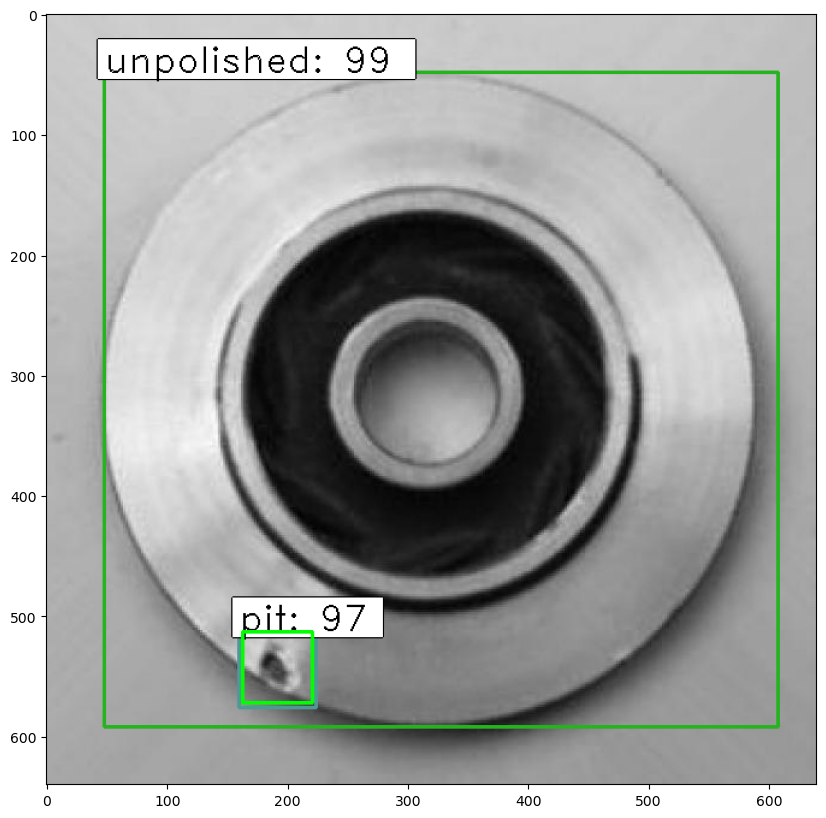

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_356_jpeg.rf.88b9b5107e4284dce19873d41259659f.jpg
Inference time = 12.878087997436523
Metric Calculation time = 0.006525993347167969
[{'class_id': 3, 'x_center': 0.5, 'y_center': 0.5125, 'width': 0.7, 'height': 0.825, 'confidence': 99.94237422943115}, {'class_id': 1, 'x_center': 0.2875, 'y_center': 0.6125, 'width': 0.075, 'height': 0.075, 'confidence': 92.43990778923035}]
[{'class_id': 1, 'x_center': 0.29453125, 'y_center': 0.6234375, 'width': 0.0765625, 'height': 0.125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  5.0  2.0  0.0  0.0  1.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  7.0  0.0  5.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  2.0  0.0  0.0  0.0  


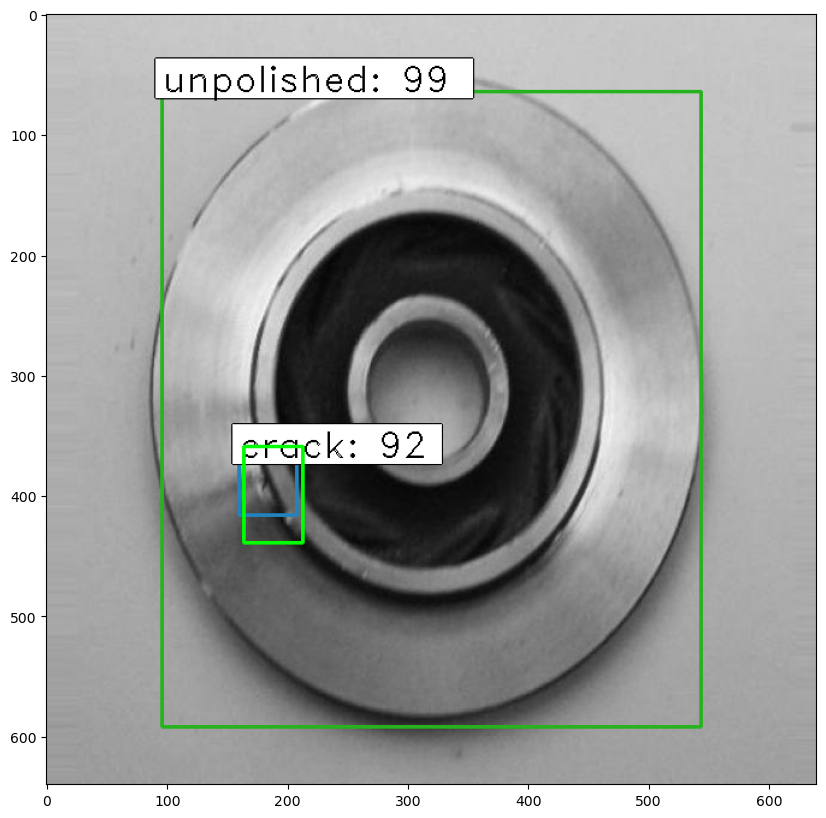

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_3743_jpeg.rf.d38ffaf711864128544c007b4da95c43.jpg
Inference time = 12.739308834075928
Metric Calculation time = 0.0075380802154541016
[{'class_id': 3, 'x_center': 0.5125, 'y_center': 0.5, 'width': 0.825, 'height': 0.8, 'confidence': 99.99380111694336}, {'class_id': 1, 'x_center': 0.275, 'y_center': 0.3875, 'width': 0.05, 'height': 0.075, 'confidence': 87.98051476478577}, {'class_id': 1, 'x_center': 0.2625, 'y_center': 0.6375, 'width': 0.075, 'height': 0.075, 'confidence': 82.68884420394897}]
[{'class_id': 2, 'x_center': 0.27890625, 'y_center': 0.3953125, 'width': 0.0515625, 'height': 0.053125}, {'class_id': 3, 'x_center': 0.51796875, 'y_center': 0.525, 'width': 0.8796875, 'height': 0.825}, {'class_id': 2, 'x_center': 0.26640625, 'y_center': 0.63671875, 'width': 0.0609375, 'height': 0.0703125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  5.0  4.0  0.0  0.0  1.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  8.0  0.

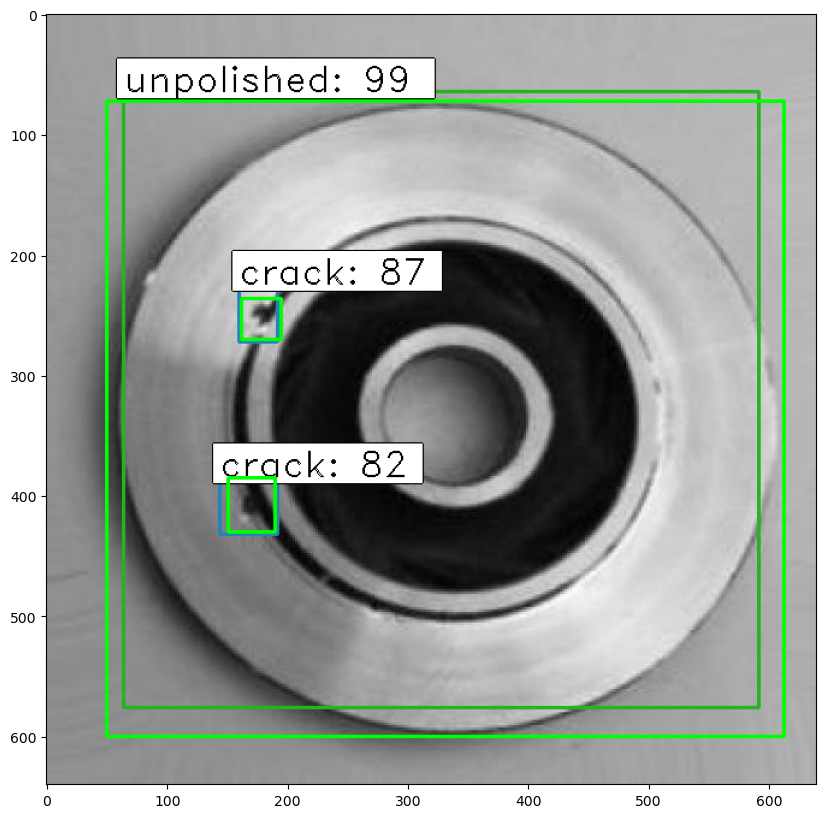

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_378_jpeg.rf.1a51446ea91952965c24cea952a1823d.jpg
Inference time = 12.116589307785034
Metric Calculation time = 0.006096363067626953
[{'class_id': 3, 'x_center': 0.4875, 'y_center': 0.5125, 'width': 0.825, 'height': 0.875, 'confidence': 99.99310970306396}, {'class_id': 1, 'x_center': 0.2625, 'y_center': 0.3125, 'width': 0.075, 'height': 0.075, 'confidence': 97.62970805168152}]
[{'class_id': 3, 'x_center': 0.47578125, 'y_center': 0.4984375, 'width': 0.8046875, 'height': 0.896875}, {'class_id': 1, 'x_center': 0.265625, 'y_center': 0.3125, 'width': 0.0625, 'height': 0.06875}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  6.0  4.0  0.0  0.0  1.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  9.0  0.0  5.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  2.0  0.0  0.0  0.0  


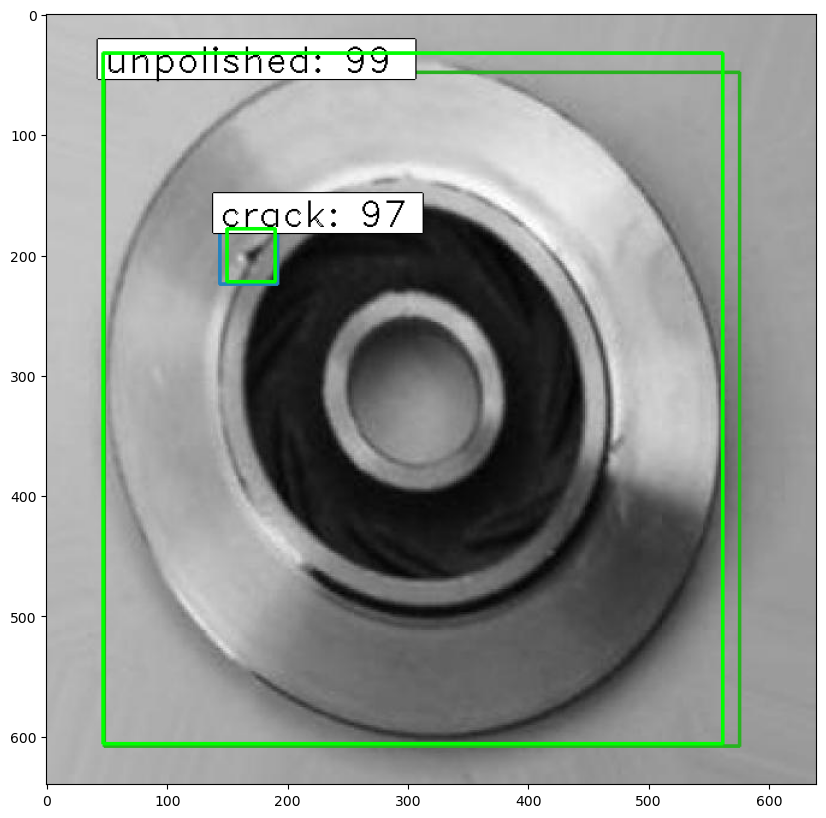

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_3866_jpeg.rf.895e73b595821ce55cbfaf6737ab692f.jpg
Inference time = 13.222346782684326
Metric Calculation time = 0.005514383316040039
[{'class_id': 3, 'x_center': 0.5, 'y_center': 0.5, 'width': 0.8, 'height': 0.85, 'confidence': 99.99417066574097}, {'class_id': 1, 'x_center': 0.7625, 'y_center': 0.425, 'width': 0.075, 'height': 0.05, 'confidence': 91.38643741607666}]
[{'class_id': 2, 'x_center': 0.759375, 'y_center': 0.4265625, 'width': 0.065625, 'height': 0.09375}, {'class_id': 3, 'x_center': 0.48984375, 'y_center': 0.49765625, 'width': 0.8140625, 'height': 0.8453125}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  6.0  4.0  0.0  0.0  2.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  10.0  0.0  5.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  3.0  0.0  0.0  0.0  


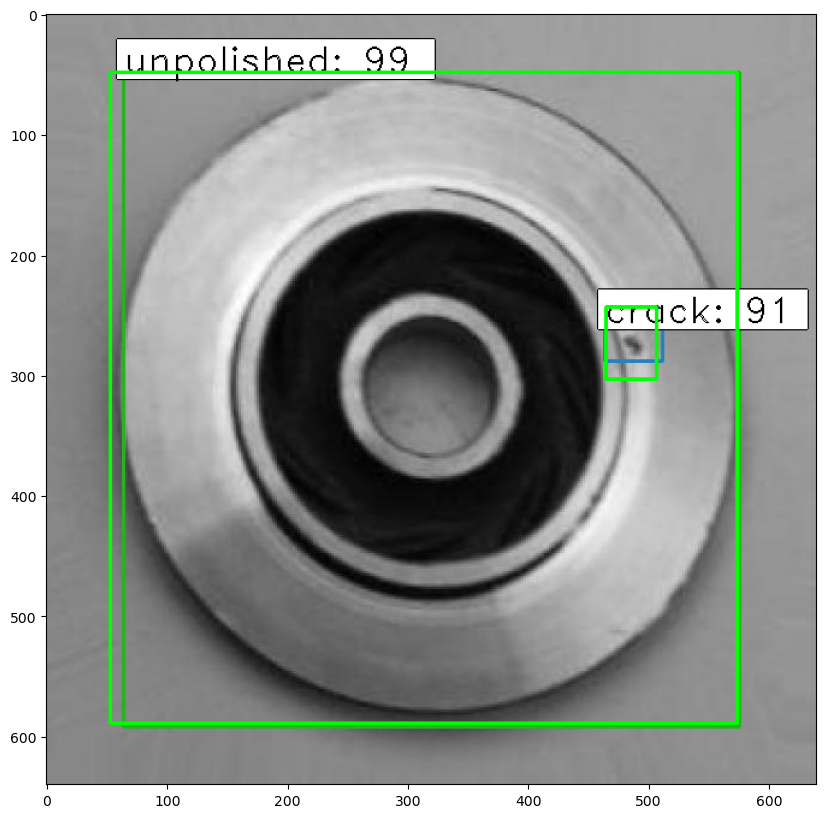

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4026_jpeg.rf.e8ad81f5f4015654a8f5aae5accf28d9.jpg
Inference time = 11.988504409790039
Metric Calculation time = 0.00404047966003418
[{'class_id': 3, 'x_center': 0.525, 'y_center': 0.4875, 'width': 0.75, 'height': 0.725, 'confidence': 99.34883117675781}, {'class_id': 1, 'x_center': 0.5375, 'y_center': 0.775, 'width': 0.075, 'height': 0.05, 'confidence': 76.4386534690857}]
[{'class_id': 2, 'x_center': 0.53984375, 'y_center': 0.76875, 'width': 0.0484375, 'height': 0.040625}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  6.0  5.0  0.0  0.0  2.0  
0.0  1.0  8.0  0.0  0.0  0.0  
0.0  0.0  0.0  10.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  7.0  
0.0  4.0  3.0  0.0  0.0  0.0  


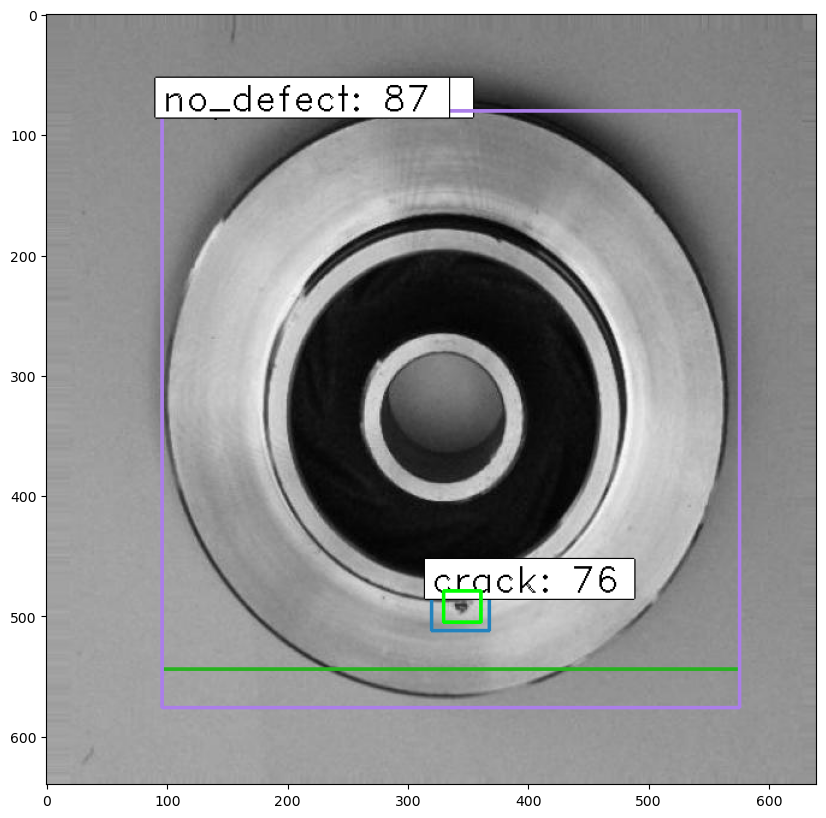

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4125_jpeg.rf.e0d3066233e99d1cb84d17226a7762e9.jpg
Inference time = 12.423203945159912
Metric Calculation time = 0.0050008296966552734
[{'class_id': 4, 'x_center': 0.5125, 'y_center': 0.45, 'width': 0.925, 'height': 0.9, 'confidence': 99.96979236602783}, {'class_id': 2, 'x_center': 0.725, 'y_center': 0.775, 'width': 0.05, 'height': 0.05, 'confidence': 99.17795062065125}]
[{'class_id': 2, 'x_center': 0.73359375, 'y_center': 0.77734375, 'width': 0.0453125, 'height': 0.0515625}]
1.0  0.0  0.0  0.0  0.0  0.0  
0.0  6.0  5.0  0.0  0.0  2.0  
0.0  1.0  9.0  0.0  0.0  0.0  
0.0  0.0  0.0  10.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  8.0  
0.0  4.0  3.0  0.0  0.0  0.0  


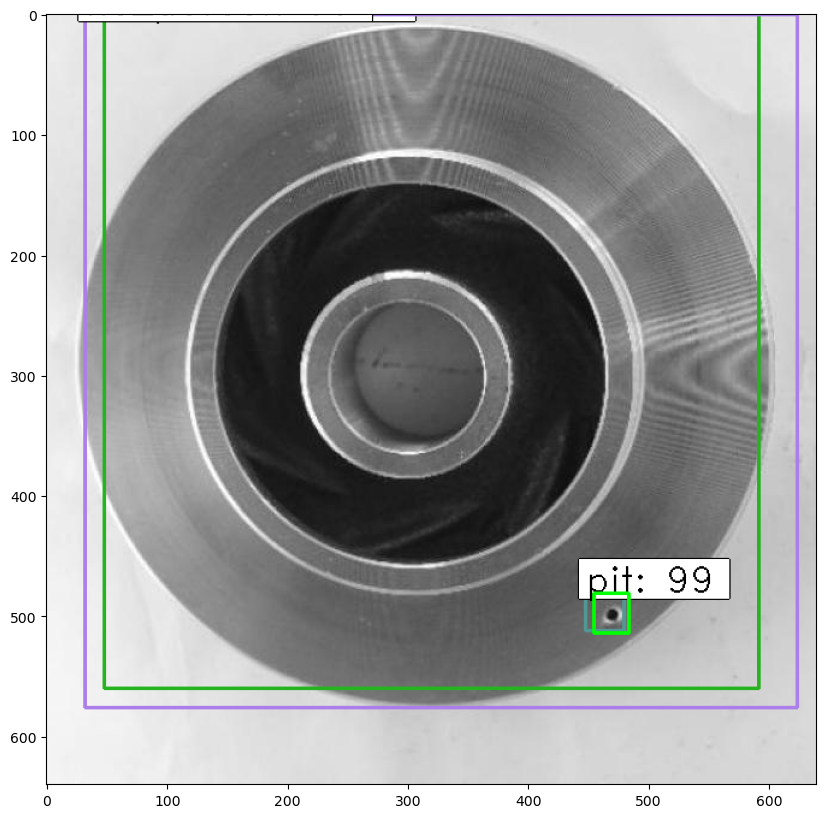

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4616_jpeg.rf.07e5761410e9d4a75f29ebc7497ef519.jpg
Inference time = 12.001908302307129
Metric Calculation time = 0.005362510681152344
[{'class_id': 0, 'x_center': 0.4875, 'y_center': 0.5125, 'width': 0.775, 'height': 0.875, 'confidence': 99.99514818191528}, {'class_id': 1, 'x_center': 0.425, 'y_center': 0.7875, 'width': 0.1, 'height': 0.075, 'confidence': 87.1674120426178}]
[{'class_id': 0, 'x_center': 0.49140625, 'y_center': 0.50234375, 'width': 0.8578125, 'height': 0.9109375}, {'class_id': 1, 'x_center': 0.4140625, 'y_center': 0.78359375, 'width': 0.121875, 'height': 0.1109375}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  7.0  5.0  0.0  0.0  2.0  
0.0  1.0  9.0  0.0  0.0  0.0  
0.0  0.0  0.0  10.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  8.0  
0.0  4.0  3.0  0.0  0.0  0.0  


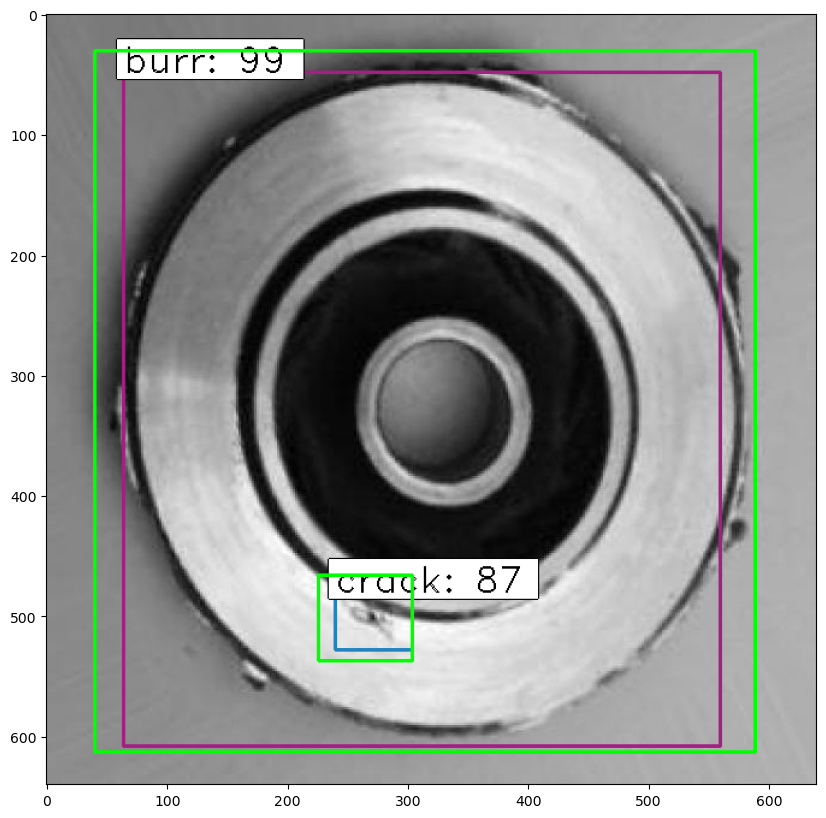

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4697_jpeg.rf.fd47a8ae48ce75afb06c05acc3845868.jpg
Inference time = 11.819906949996948
Metric Calculation time = 0.006999015808105469
[{'class_id': 4, 'x_center': 0.5125, 'y_center': 0.475, 'width': 0.825, 'height': 0.85, 'confidence': 99.98974800109863}, {'class_id': 2, 'x_center': 0.35, 'y_center': 0.15, 'width': 0.05, 'height': 0.05, 'confidence': 98.11526536941528}]
[{'class_id': 2, 'x_center': 0.3625, 'y_center': 0.1390625, 'width': 0.046875, 'height': 0.05625}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  7.0  5.0  0.0  0.0  2.0  
0.0  1.0  10.0  0.0  0.0  0.0  
0.0  0.0  0.0  10.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  4.0  3.0  0.0  0.0  0.0  


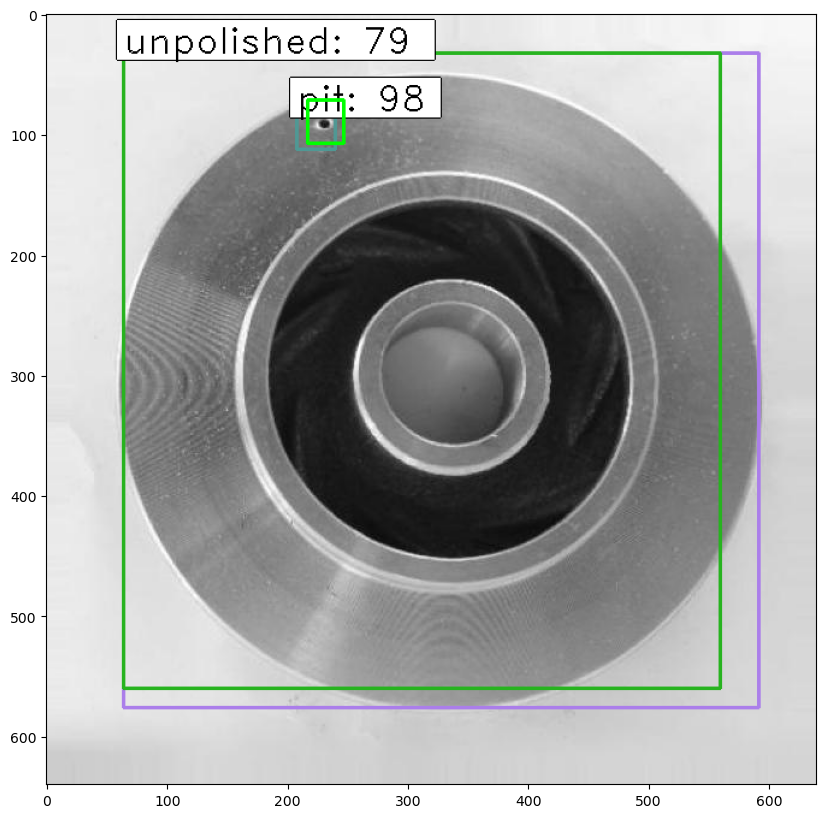

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4816_jpeg.rf.35462c80aaceac882a9101c44a3ad7a7.jpg
Inference time = 12.32910704612732
Metric Calculation time = 0.0050449371337890625
[{'class_id': 3, 'x_center': 0.55, 'y_center': 0.5, 'width': 0.9, 'height': 0.85, 'confidence': 99.99687671661377}, {'class_id': 1, 'x_center': 0.725, 'y_center': 0.275, 'width': 0.1, 'height': 0.05, 'confidence': 95.2098548412323}]
[{'class_id': 1, 'x_center': 0.72578125, 'y_center': 0.284375, 'width': 0.0796875, 'height': 0.0875}, {'class_id': 3, 'x_center': 0.53828125, 'y_center': 0.5125, 'width': 0.9203125, 'height': 0.896875}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  7.0  5.0  0.0  0.0  3.0  
0.0  1.0  10.0  0.0  0.0  0.0  
0.0  0.0  0.0  11.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  5.0  3.0  0.0  0.0  0.0  


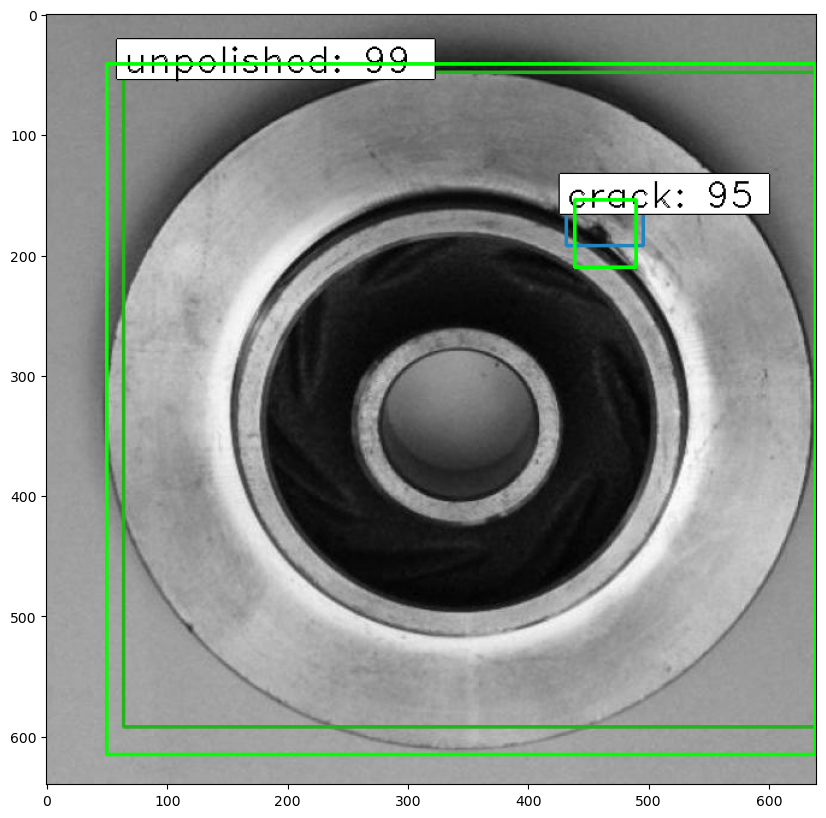

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4845_jpeg.rf.4aeeccaeceadde32548f7f4034b3b4b3.jpg
Inference time = 12.109169483184814
Metric Calculation time = 0.005090236663818359
[{'class_id': 3, 'x_center': 0.5375, 'y_center': 0.5, 'width': 0.825, 'height': 0.8, 'confidence': 99.96248483657837}, {'class_id': 2, 'x_center': 0.8375, 'y_center': 0.775, 'width': 0.075, 'height': 0.1, 'confidence': 82.90368914604187}]
[{'class_id': 3, 'x_center': 0.53671875, 'y_center': 0.5109375, 'width': 0.8609375, 'height': 0.85}, {'class_id': 2, 'x_center': 0.840625, 'y_center': 0.78125, 'width': 0.09375, 'height': 0.1}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  7.0  5.0  0.0  0.0  3.0  
0.0  1.0  11.0  0.0  0.0  0.0  
0.0  0.0  0.0  12.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  5.0  3.0  0.0  0.0  0.0  


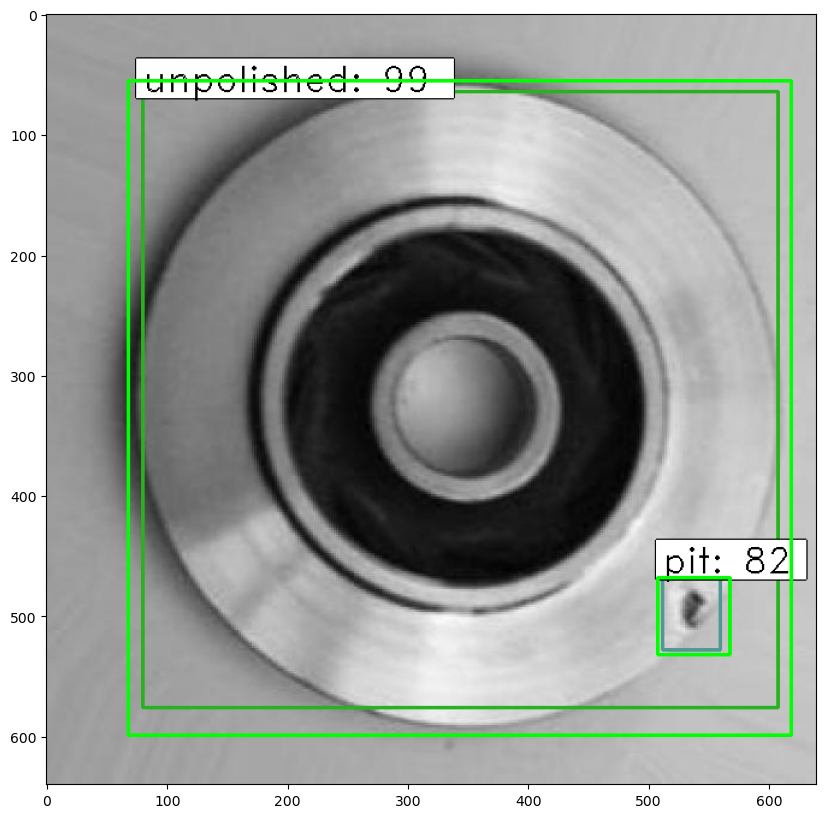

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_4957_jpeg.rf.0dcd38b896d0cc5d2f4917751568b8b6.jpg
Inference time = 12.288063049316406
Metric Calculation time = 0.0042188167572021484
[{'class_id': 3, 'x_center': 0.525, 'y_center': 0.4875, 'width': 0.8, 'height': 0.825, 'confidence': 99.98643398284912}]
[{'class_id': 1, 'x_center': 0.790625, 'y_center': 0.46640625, 'width': 0.065625, 'height': 0.0578125}, {'class_id': 3, 'x_center': 0.5234375, 'y_center': 0.49453125, 'width': 0.83125, 'height': 0.8671875}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  7.0  5.0  0.0  0.0  3.0  
0.0  1.0  11.0  0.0  0.0  0.0  
0.0  0.0  0.0  13.0  0.0  6.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  6.0  3.0  0.0  0.0  0.0  


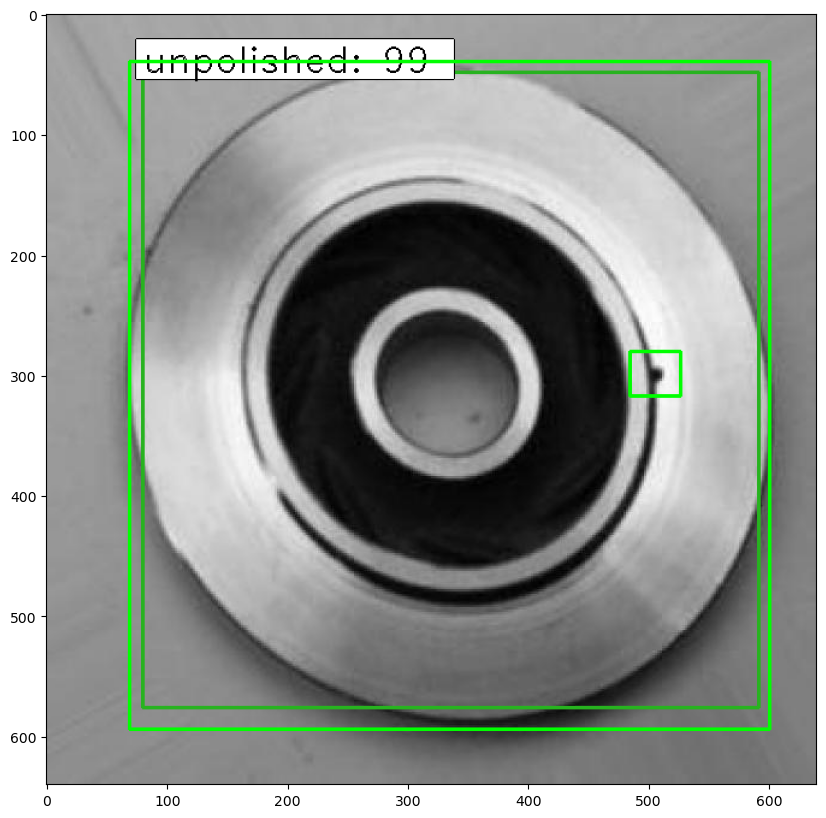

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_5218_jpeg.rf.ec3c670f28e20a17aebe83461220c648.jpg
Inference time = 12.299779891967773
Metric Calculation time = 0.008645772933959961
[{'class_id': 3, 'x_center': 0.5375, 'y_center': 0.5, 'width': 0.725, 'height': 0.85, 'confidence': 99.48515295982361}, {'class_id': 1, 'x_center': 0.6125, 'y_center': 0.7875, 'width': 0.125, 'height': 0.125, 'confidence': 90.63897132873535}, {'class_id': 1, 'x_center': 0.55, 'y_center': 0.8375, 'width': 0.1, 'height': 0.075, 'confidence': 86.54475808143616}]
[{'class_id': 1, 'x_center': 0.61953125, 'y_center': 0.75234375, 'width': 0.0640625, 'height': 0.1078125}, {'class_id': 1, 'x_center': 0.53671875, 'y_center': 0.83828125, 'width': 0.0859375, 'height': 0.0859375}]
2.0  0.0  0.0  0.0  0.0  0.0  
0.0  8.0  5.0  0.0  0.0  4.0  
0.0  1.0  11.0  0.0  0.0  0.0  
0.0  0.0  0.0  13.0  0.0  7.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  7.0  3.0  0.0  0.0  0.0  


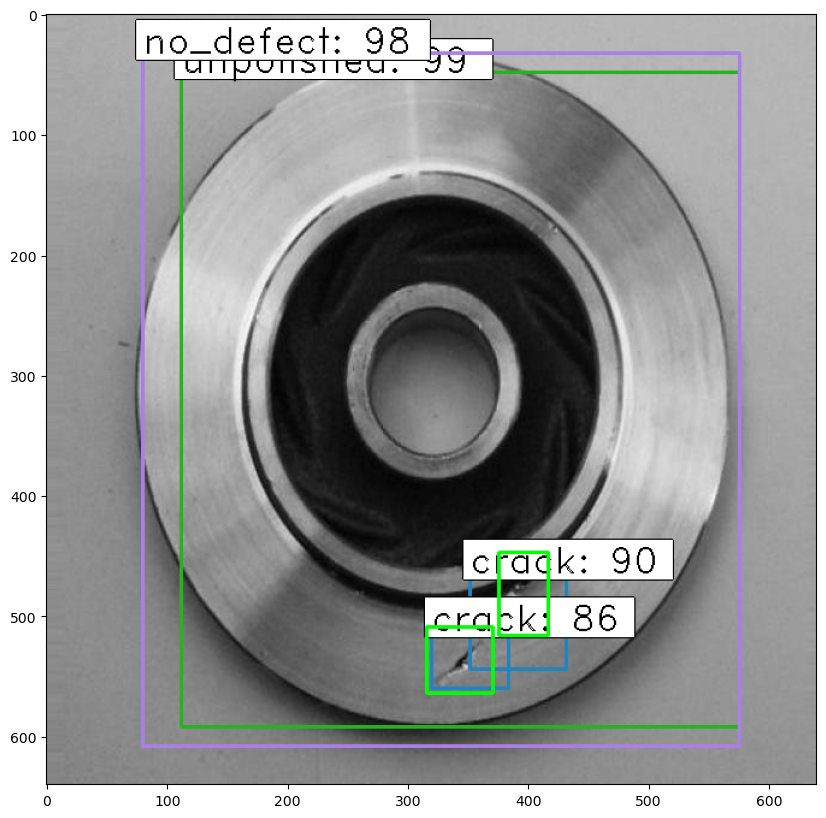

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_5331_jpeg.rf.39e2612f156de01ef45fe61be9f83927.jpg
Inference time = 12.430678844451904
Metric Calculation time = 0.007234096527099609
[{'class_id': 0, 'x_center': 0.475, 'y_center': 0.5, 'width': 0.8, 'height': 0.8, 'confidence': 99.99918937683105}, {'class_id': 1, 'x_center': 0.45, 'y_center': 0.225, 'width': 0.1, 'height': 0.05, 'confidence': 84.40319895744324}]
[{'class_id': 0, 'x_center': 0.471875, 'y_center': 0.49765625, 'width': 0.8875, 'height': 0.8828125}, {'class_id': 1, 'x_center': 0.41015625, 'y_center': 0.2421875, 'width': 0.1390625, 'height': 0.065625}]
3.0  0.0  0.0  0.0  0.0  0.0  
0.0  9.0  5.0  0.0  0.0  4.0  
0.0  1.0  11.0  0.0  0.0  0.0  
0.0  0.0  0.0  13.0  0.0  7.0  
0.0  0.0  0.0  0.0  0.0  9.0  
0.0  7.0  3.0  0.0  0.0  0.0  


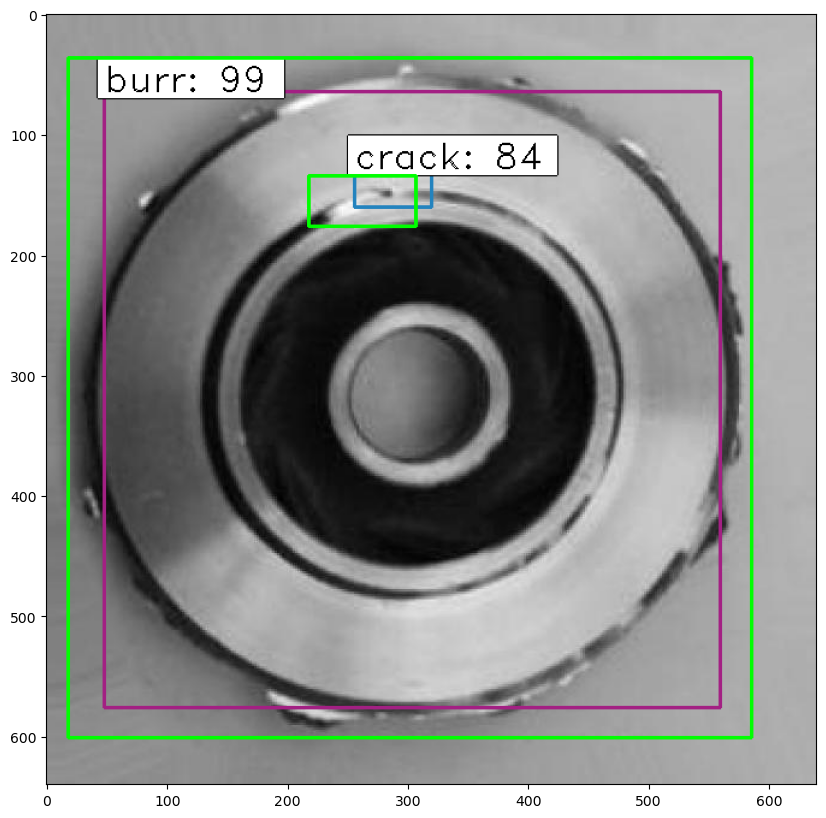

c:\Users\luizh\Desktop\estagio\notebooks\casting\dataset\test\images\cast_def_0_5415_jpeg.rf.21c1da31ef1d981b1035472fcc2cfb2b.jpg


In [136]:
# if the box classification value is less than this, we ignore this box
bbox_threshold = 0.7

iou_tresholds = [0.05, 0.5, 0.95]

# spatial index config
grid_size = 10
image_size = (640, 640) 	# change this to img_data.shape[:2] below if you have different image sizes

# heuristics mode
# for improving how the model predicts classes that can't coexist in the same image
# e.g. no defect and defect classes
heuristics = True

# Test 5 images
#all_data = all_data[:10]

# Create a folder to store the scores based on model name
model_name = C.model_path.split('/')[-1].split('.')[0]
if not os.path.exists(f"scores/{model_name}"):
	os.makedirs(f"scores/{model_name}")

# init one confusion matrix for each IoU threshold
conf_mats = {}
scores = {}
bbox_mapping = {}
for iou_treshold in iou_tresholds:
	conf_mats[iou_treshold] = np.zeros((len(classes_count), len(classes_count)))
	scores[iou_treshold] = {}
	bbox_mapping[iou_treshold] = []

	with open(f"scores/{model_name}/anotacoes@{iou_treshold}.csv", "w") as f:
		writer = csv.writer(f)
		writer.writerow(["arquivo", "classe_real", "classe_tentativa", "acerto", "iou", "tempo_anotacao(ms)"])


# Iterate over all images
for idx, img_data in enumerate(all_data):
	if not img_data['img_path'].endswith(('.jpeg', '.png', '.jpg')):
		continue

	print(img_data['img_path'])

	start_time = time.time()

	img = cv2.imread(img_data['img_path'])

	X, ratio = format_img(img, C)

	X = np.transpose(X, (0, 2, 3, 1))

	# get output layer Y1, Y2 from the RPN and the feature maps F
	# Y1: y_rpn_cls
	# Y2: y_rpn_regr
	[Y1, Y2, F] = model_rpn.predict(X, verbose=0)

	# Get bboxes by applying Non-max Suppression
	# R.shape = (300, 4)
	R = rpn_to_roi(Y1, Y2, C, K.image_data_format(), overlap_thresh=0.7)

	# convert from (x1, y1, x2, y2) to (x, y, w, h)
	R[:, 2] -= R[:, 0]
	R[:, 3] -= R[:, 1]

	# apply the spatial pyramid pooling to the proposed regions
	bboxes = {}
	probs = {}

	# ground truth bboxes for current image
	ground_truth = []

	for jk in range(R.shape[0]//C.num_rois + 1):
		ROIs = np.expand_dims(R[C.num_rois*jk:C.num_rois*(jk+1), :], axis=0)
		if ROIs.shape[1] == 0:
			break
        
		if jk == R.shape[0]//C.num_rois:
			#pad R
			curr_shape = ROIs.shape
			target_shape = (curr_shape[0],C.num_rois,curr_shape[2])
			ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
			ROIs_padded[:, :curr_shape[1], :] = ROIs
			ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
			ROIs = ROIs_padded

		[P_cls, P_regr] = model_classifier_only.predict([F, ROIs], verbose=0)

        # Calculate bboxes coordinates on resized image
		for ii in range(P_cls.shape[1]):
			# Ignore 'bg' class
			if np.max(P_cls[0, ii, :]) < bbox_threshold or np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
				continue

			cls_name = inv_mapping[np.argmax(P_cls[0, ii, :])]

			if cls_name not in bboxes:
				bboxes[cls_name] = []
				probs[cls_name] = []

			(x, y, w, h) = ROIs[0, ii, :]

			cls_num = np.argmax(P_cls[0, ii, :])
			try:
				(tx, ty, tw, th) = P_regr[0, ii, 4*cls_num:4*(cls_num+1)]
				tx /= C.classifier_regr_std[0]
				ty /= C.classifier_regr_std[1]
				tw /= C.classifier_regr_std[2]
				th /= C.classifier_regr_std[3]
				x, y, w, h = apply_regr(x, y, w, h, tx, ty, tw, th)
			except:
				pass
			bboxes[cls_name].append([C.rpn_stride*x, C.rpn_stride*y, C.rpn_stride*(x+w), C.rpn_stride*(y+h)])
			probs[cls_name].append(np.max(P_cls[0, ii, :]))

	print('Inference time = {}'.format(time.time() - start_time))
	metric_start_time = time.time()

	all_dets = []


	for key in bboxes:
		bbox = np.array(bboxes[key])

		new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.2)

		for jk in range(new_boxes.shape[0]):
			(x1, y1, x2, y2) = new_boxes[jk,:]

			# Calculate real coordinates on original image
			(real_x1, real_y1, real_x2, real_y2) = get_real_coordinates(ratio, x1, y1, x2, y2)

			cv2.rectangle(img, (real_x1, real_y1), (real_x2, real_y2), (int(class_to_color[key][0]), int(class_to_color[key][1]), int(class_to_color[key][2])),2)

			textLabel = '{}: {}'.format(key,int(100*new_probs[jk]))

			all_dets.append({
				"class_id": class_mapping[key],
				"x_center": (real_x1 + real_x2) / 2 / image_size[0],
				"y_center": (real_y1 + real_y2) / 2 / image_size[1],
				"width": (real_x2 - real_x1) / image_size[0],
				"height": (real_y2 - real_y1) / image_size[1],
				"confidence": new_probs[jk]*100
			})

			(retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,1,1)
			textOrg = (real_x1, real_y1-0)

			cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 2)
			cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
			cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 0), 1)

	# Include ground-truth bboxes in the image
	for gtbbox in img_data['bboxes']:
		x1, y1, x2, y2 = gtbbox['x1'], gtbbox['y1'], gtbbox['x2'], gtbbox['y2']
		cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
		ground_truth.append( convert_to_xywh(gtbbox, image_size) )

	# sort all dets by confidence
	#all_dets = sorted(all_dets, key=lambda x: x['confidence'], reverse=True)

	# Apply heuristics to the predicted boxes
	if heuristics:
		for det in all_dets:
			if det['class_id'] == 4:
				for det2 in all_dets:
					if det2 is not det and (det2['class_id'] == 3 or det2['class_id'] == 0):
						if det['confidence'] > det2['confidence']:
							all_dets.remove(det2)
						else:
							all_dets.remove(det)
							break


	# for each iou threshold, populate the confusion matrix
	for iou_treshold in iou_tresholds:
		partial_conf_mat, partial_bbox_mapping = populate_confusion_matrix(model_name,
													   		img_data['img_path'],
															len(class_names), 
															all_dets, 
															create_spatial_index(ground_truth, grid_size, image_size), 
															grid_size, 
															image_size, 
															iou_treshold)
		conf_mats[iou_treshold] += partial_conf_mat
		bbox_mapping[iou_treshold] += partial_bbox_mapping

	print('Metric Calculation time = {}'.format(time.time() - metric_start_time))

	# DEBUG: show confusion matrix being populated
	print(all_dets)
	print(ground_truth)

	for i in range(conf_mats[0.5].shape[0]):
		for j in range(conf_mats[0.5].shape[1]):
			print(conf_mats[0.5][i][j]," ", end="")
		print()

	plt.figure(figsize=(10, 10))
	plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
	plt.show()

print("Total Test time: ", time.time() - start_time)


		

	

### Metrics 

In [1]:

for conf_mat_id in conf_mats:
	conf_mat = conf_mats[conf_mat_id]

	print(f"Confusion Matrix for IoU threshold {conf_mat_id}")

	# Calculate scores
	tp = np.diag(conf_mat)
	fp = np.sum(conf_mat, axis=1) - tp
	fn = np.sum(conf_mat, axis=0) - tp
	tn = np.sum(conf_mat) - (fp + fn + tp)

	print("True Positives: ", tp)
	print("False Positives: ", fp)
	print("False Negatives: ", fn)
	print("True Negatives: ", tn)

	precision = np.zeros(len(class_names))
	recall = np.zeros(len(class_names))
	f1_score = np.zeros(len(class_names))
	accuracy = np.zeros(len(class_names))
	for i in range(len(class_names) - 1):
		if(tp[i] + fp[i] != 0):
			precision[i] = tp[i] / (tp[i] + fp[i])
		if(tp[i] + fn[i] != 0):
			recall[i] = tp[i] / (tp[i] + fn[i])
		if (precision[i] + recall[i]) != 0:
			f1_score[i] = 2 * (precision[i] * recall[i]) / (precision[i] + recall[i])
		accuracy[i] = (tp[i] + tn[i]) / (tp[i] + tn[i] + fp[i] + fn[i])


	# Special case for the background class
	# since there are no true positives for the background class
	# calculate the precision and recall using the true negatives
	# precision - de todas as caixas que deveriam estar marcadas, x% foram marcadas
	# recall - de todas as caixas marcadas, x% são realmente caixas que deveriam estar marcadas

	# if(tn[5] + fp[5] != 0):
	# 	precision[5] = tn[5] / (tn[5] + fp[5])
	# else :
	# 	precision[5] = 0

	# if(tn[5] + fn[5] != 0):
	# 	recall[5] = tn[5] / (tn[5] + fn[5])
	# else:
	# 	recall[5] = 0

	print("Precision: ", precision)
	print("Recall: ", recall)

	print("Mean Precision: ", np.mean(precision))
	print("Mean Recall: ", np.mean(recall))

	print("Test Accuracy: ", np.mean(accuracy))

	plt.figure(figsize=(10, 10))
	plt.imshow(conf_mat, interpolation='nearest', cmap=plt.cm.Blues)
	plt.title('Confusion Matrix')
	plt.colorbar()
	tick_marks = np.arange(len(classes_count))
	plt.xticks(tick_marks, class_names, rotation=45)
	plt.yticks(tick_marks, class_names)
	plt.ylabel('Predicted label')
	plt.xlabel('True label')

	# Add the values in each cell
	for i in range(conf_mat.shape[0]):
		for j in range(conf_mat.shape[1]):
			_precision = 0 if i >= len(precision) else precision[i]
			_recall = 0 if j >= len(recall) else recall[j]
			if (i == j):
				plt.text(j, i, format( f"{conf_mat[i, j]}\n({_precision:.2f}\n{_recall:.2f})"),
				horizontalalignment="center",
				verticalalignment="center",
				color="white" if conf_mat[i, j] > conf_mat.max() / 2. else "black")
			else:
				plt.text(j, i, format( f"{conf_mat[i, j]}"),
				horizontalalignment="center",
				color="white" if conf_mat[i, j] > conf_mat.max() / 2. else "black")

	plt.savefig(f"scores/{model_name}/confusion_matrix@{conf_mat_id}.png")
			
	plt.show()


	# Show the precision x recall curve for each class

	# For every tuple in the bbox_mapping, calculate the precision and recall cumulatively

	# sort bbox_mapping by confidence
	#bbox_mapping[conf_mat_id] = sorted(bbox_mapping[conf_mat_id], key=lambda x: (x[0]['confidence'] if x[0] is not None else -1), reverse=True)

	# sort bbox_mapping by IoU
	bbox_mapping[conf_mat_id] = sorted(bbox_mapping[conf_mat_id], key=lambda x: (x[2] if x[2] is not None else -1), reverse=True)

	# count the number of ground truth boxes for each class in the dataset
	num_gt_boxes = np.zeros(len(class_names))
	for box in bbox_mapping[conf_mat_id]:
		if box[1] is not None:
			num_gt_boxes[box[1]['class_id']] += 1

	precisions = [ [] for _ in range(len(class_names) - 1) ]
	recalls = [ [] for _ in range(len(class_names) - 1) ]
	ctp = np.zeros(len(class_names) - 1)
	cfp = np.zeros(len(class_names) - 1)

	for i in range(len(bbox_mapping[conf_mat_id])):
		box_list = bbox_mapping[conf_mat_id][i]
  
		if ((box_list[2] is not None and box_list[2] >= conf_mat_id) and
			(box_list[1] is not None and box_list[0] is not None) and 
			(box_list[0]['class_id'] == box_list[1]['class_id'])):

			ctp[box_list[0]['class_id']] += 1
		# elif box_list[0] is None and box_list[1] is not None:
		# 	cfn += 1
		elif box_list[1] is not None:
			cfp[box_list[1]['class_id']] += 1
		elif box_list[0] is not None:
			cfp[box_list[0]['class_id']] += 1
		
		if box_list[1] is not None:
			precisions[box_list[1]['class_id']].append(ctp[box_list[1]['class_id']] / (ctp[box_list[1]['class_id']] + cfp[box_list[1]['class_id']]))
			recalls[box_list[1]['class_id']].append(ctp[box_list[1]['class_id']] / num_gt_boxes[ box_list[1]['class_id'] ])
		else:
			if (ctp[box_list[0]['class_id']] + cfp[box_list[0]['class_id']]) == 0:
				precisions[box_list[0]['class_id']].append(0.0)
			else:
				precisions[box_list[0]['class_id']].append(ctp[box_list[0]['class_id']] / (ctp[box_list[0]['class_id']] + cfp[box_list[0]['class_id']]))
			
			if num_gt_boxes[ box_list[0]['class_id'] ] == 0:
				recalls[box_list[0]['class_id']].append(0.0)
			else:
				recalls[box_list[0]['class_id']].append(ctp[box_list[0]['class_id']] / num_gt_boxes[ box_list[0]['class_id'] ])

	# Calculate the average precision for each class
	# Interpolate the precision x recall curve and calculate the interpolated AP
	aps = []
	interp_aps = []
	interp_precisions = [ [] for _ in range(len(class_names) - 1) ]
	for j in range(len(class_names) - 1):

		# at each recall level, replace each precision with the maximum precision value to the right of that recall level
		interp_space = np.linspace(0, 1, 1001)
		
		for interp in interp_space:
			max_prec = 0
			for i in range(len(recalls[j])):
				if recalls[j][i] >= interp:
					max_prec = max(max_prec, precisions[j][i])
			interp_precisions[j].append(max_prec)
		
		aps.append(calculate_ap(precisions[j], recalls[j]))
		interp_aps.append(calculate_ap(list(interp_precisions[j]), list(interp_space)))


	# Calculate the mean average precision
	mean_ap = np.mean(aps)
	print(f"mAP@{conf_mat_id}: {mean_ap:.2f}")

	# Plot the precision x recall curve for each class
	for k in range(len(class_names) - 1):
		print(f"Class {class_names[k]} - AP: {aps[k]:.2f}")
		print(f"Interpolated AP: {interp_aps[k]:.2f}")
		print(precisions[k], recalls[k])
		plt.title(f"PR Curve for Class {class_names[k]} - IoU@{conf_mat_id}")
		plt.xlabel("Recall")
		plt.ylabel("Precision")
		plt.xlim([-0.05, 1.05])
		plt.ylim([-0.05, 1.05])
		plt.plot(recalls[k], precisions[k], label=f"{class_names[k]} - AP: {aps[k]:.2f}")
		plt.plot(interp_space, interp_precisions[k], linestyle='--', label=f"{class_names[k]} - Interpolated")
		plt.show()

	# Save score data to csv

	with open(f"scores/{model_name}/scores@{conf_mat_id}.csv", "w") as f:
		writer = csv.writer(f)
		writer.writerow(["classe", "precision", "recall", "AP", "f1_score"])
		for i in range(len(class_names) - 1):
			writer.writerow([class_names[i], precision[i], recall[i], aps[i], f1_score[i]])

		writer.writerow([])
		writer.writerow(["mean_precision", np.mean(precision)])
		writer.writerow(["mean_recall", np.mean(recall)])
		writer.writerow(["mAP", mean_ap])	

		f.close()

print("Script runtime: ", time.time() - start_time)



NameError: name 'conf_mats' is not defined